In [2]:
#All the packages we used
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree
from scipy.stats import entropy
from statsmodels.graphics.mosaicplot import mosaic
from itertools import product
from sklearn.model_selection import train_test_split

In [17]:
#We assigned a data set to each variable to used for our analysis
heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
HD_comb = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\HD_combination.csv")
HD_comb = HD_comb.drop(['Unnamed: 0'], axis=1)
bin_edges= [0, 18.5, 24.9, 29.9, float('inf')]
labels = [1, 2, 3, 4]
df_copy = df.copy()
# categorize the BMI column into 4 levels
df_copy["BMI"] = pd.cut(df_copy["BMI"], bins=bin_edges, labels=labels)


In [18]:
df_temp1, df_temp2  =train_test_split(HD_comb, test_size=0.05)
df_temp2

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,Education_AnyHealthcare,Education_NoDocbcCost,Education_GenHlth,Education_MentHlth,Education_PhysHlth,Education_DiffWalk,Education_Sex,Education_Age,Education_Education,Education_Income
231239,0.0,0.0,0.0,1.0,30.0,1.0,0.0,2.0,1.0,1.0,...,11,10,28,144,145,10,11,66,5,46
212420,0.0,0.0,0.0,1.0,22.0,1.0,0.0,0.0,1.0,1.0,...,9,8,21,111,113,8,9,52,4,36
48234,0.0,0.0,0.0,1.0,26.0,1.0,0.0,0.0,1.0,1.0,...,11,10,25,132,138,10,11,67,5,47
251713,1.0,1.0,0.0,1.0,29.0,0.0,0.0,2.0,0.0,1.0,...,3,2,9,33,38,3,3,15,1,9
144154,1.0,1.0,1.0,1.0,21.0,1.0,0.0,2.0,1.0,0.0,...,11,10,29,132,162,11,11,67,5,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138197,0.0,0.0,0.0,1.0,25.0,0.0,0.0,0.0,1.0,1.0,...,11,10,26,132,138,10,10,65,5,40
137509,0.0,1.0,0.0,1.0,40.0,0.0,0.0,0.0,1.0,0.0,...,9,8,21,125,133,8,8,62,4,35
43030,0.0,0.0,0.0,1.0,26.0,1.0,0.0,0.0,1.0,1.0,...,7,6,17,70,76,6,6,51,3,31
84569,0.0,1.0,1.0,1.0,32.0,1.0,0.0,0.0,0.0,1.0,...,11,10,27,132,162,10,11,77,5,47


In [19]:
df_temp2[['HeartDiseaseorAttack','Stroke']]

,HeartDiseaseorAttack,Stroke
231239,0.0,0.0
212420,0.0,0.0
48234,0.0,0.0
251713,1.0,0.0
144154,1.0,0.0
...,...,...
138197,0.0,0.0
137509,0.0,0.0
43030,0.0,0.0
84569,0.0,0.0


In [9]:
#df_copy = HD_comb.copy()

# define the bin edges and labels
bins = [0, 18.5, 24.9, 29.9, float("inf")]
labels = [1, 2, 3, 4]

menbins = [0, 1, 7, 14, 21, float('inf')]
menlabs = [0, 1, 2, 3, 4]

phybins = [0, 1, 7, 14, 21, float('inf')]
phylabs = [0, 1, 2, 3, 4]

# categorize the BMI column into 4 levels
df_copy["BMI"] = pd.cut(df_copy["BMI"], bins=bins, labels=labels)
df_copy["MentHlth"] = pd.cut(df_copy["MentHlth"], bins=menbins, labels=menlabs, include_lowest=True)
df_copy["PhysHlth"] = pd.cut(df_copy["PhysHlth"], bins=phybins, labels=phylabs, include_lowest=True)


df_copy.head()

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,1,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,3,3,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0,0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,1,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,4,4,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0,0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,1,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,1,0,0.0,0.0,11.0,5.0,4.0


In [10]:
df_copy['BMI']

0         1
1         1
2         1
3         1
4         1
         ..
253675    1
253676    1
253677    1
253678    1
253679    1
Name: BMI, Length: 253680, dtype: category
Categories (4, int64): [1 < 2 < 3 < 4]

In [37]:
n_lst = []
for a in range(len(HD_comb["Stroke"])):
    val = str(HD_comb['HeartDiseaseorAttack'][a]) +','+ str(HD_comb['Stroke'][a])
    n_lst.append(val)
com_df = pd.DataFrame(n_lst)
com_df.columns = ["HD_Stroke"]
com_df["HD_Stroke"] = com_df["HD_Stroke"].astype('category')
com_df.value_counts()

HD_Stroke
0.0,0.0      223432
1.0,0.0       19956
0.0,1.0        6355
1.0,1.0        3937
dtype: int64

In [38]:
com_df["HD_Stroke"] = com_df["HD_Stroke"].cat.codes
com_df.value_counts()

HD_Stroke
0            223432
2             19956
1              6355
3              3937
dtype: int64

In [39]:
HD_comb = pd.concat([HD_comb, com_df], axis =1)
HD_comb['HD_Stroke'].value_counts()

0    223432
2     19956
1      6355
3      3937
Name: HD_Stroke, dtype: int64

In [34]:
#this gets us the general entropy
def entropy(Y):
    unique, count = np.unique(Y, return_counts=True, axis=0)
    prob = count/len(Y)
    en = np.sum((-1)*prob*np.log2(prob))
    return en


# this gets us the Joint Entropy
def jEntropy(Y,X):

    YX = np.c_[Y,X]
    return entropy(YX)

#this gets us the Conditional Entropy
def cEntropy(Y, X):

    return jEntropy(Y, X) - entropy(X)


#this gets us the Information Gain
def gain(Y, X):

    return entropy(Y) - cEntropy(Y,X)

In [35]:
#This combined two variable into a string and assigned a numerical value
def two_way_Combin(var1,var2):
    new_combin_names = var1 + "+" + var2 
    df_copy = df.copy()
    df_copy[new_combin_names] = df_copy[var1].astype(str) + "," +  df_copy[var2].astype(str)
    # Move last column to the first
    #temp_cols=df.columns.tolist()
    #new_cols=temp_cols[-1:] + temp_cols[:-1]
    #df1 = df[new_cols]
    
    # rename the elements as number in new column we create
    df_copy[new_combin_names] = df_copy[new_combin_names].astype('category')
    df_copy[new_combin_names] = df_copy[new_combin_names].cat.codes
    df_copy = df_copy.drop(columns=[var1, var2])
    
    return df_copy

# Mosaic Plots

In [56]:
#creates mosaic plot with two variable and assigned a certain figure sized
def mosaic_plot(df, var1, var2):

    mosaic_plot = mosaic(df,[var1,var2])
    plt.figure(figsize=(60,80))
    plt.rcParams["figure.figsize"]=(60, 80)
    plt.rcParams['font.size'] = 40
    return mosaic_plot





HighBP (<Figure size 6000x8000 with 3 Axes>, {('0', '1.0'): (0.0, 0.0, 0.8677469617671228, 0.3857446902914355), ('0', '0.0'): (0.0, 0.38906694942764813, 0.8677469617671228, 0.6109330505723518), ('2', '1.0'): (0.8726730701415071, 0.0, 0.0775034836953735, 0.7356216899770857), ('2', '0.0'): (0.8726730701415071, 0.7389439491132983, 0.0775034836953735, 0.2610560508867016), ('1', '1.0'): (0.9551026622112648, 0.0, 0.024681030210668406, 0.6941456618510027), ('1', '0.0'): (0.9551026622112648, 0.6974679209872153, 0.024681030210668406, 0.30253207901278456), ('3', '1.0'): (0.9847098007963175, 0.0, 0.01529019920368238, 0.8098481313241696), ('3', '0.0'): (0.9847098007963175, 0.8131703904603821, 0.01529019920368238, 0.1868296095396178)})
HighChol (<Figure size 6000x8000 with 3 Axes>, {('0', '1.0'): (0.0, 0.0, 0.8677469617671228, 0.38815796438739), ('0', '0.0'): (0.0, 0.3914802235236026, 0.8677469617671228, 0.6085197764763973), ('2', '1.0'): (0.8726730701415071, 0.0, 0.0775034836953735, 0.695167241685

Diabetes (<Figure size 6000x8000 with 3 Axes>, {('0', '0.0'): (0.0, 0.0, 0.8677469617671228, 0.8616026471096647), ('0', '2.0'): (0.0, 0.8649139053878103, 0.8677469617671228, 0.11486671856426853), ('0', '1.0'): (0.0, 0.9830918822302246, 0.8677469617671228, 0.016908117769775265), ('2', '0.0'): (0.8726730701415071, 0.0, 0.0775034836953735, 0.6546355624758574), ('2', '2.0'): (0.8726730701415071, 0.657946820754003, 0.0775034836953735, 0.31071668929923973), ('2', '1.0'): (0.8726730701415071, 0.9719747683313885, 0.0775034836953735, 0.028025231668611324), ('1', '0.0'): (0.9551026622112648, 0.0, 0.024681030210668406, 0.7126369704201206), ('1', '2.0'): (0.9551026622112648, 0.7159482286982664, 0.024681030210668406, 0.2551049650637502), ('1', '1.0'): (0.9551026622112648, 0.9743644520401623, 0.024681030210668406, 0.025635547959837593), ('3', '0.0'): (0.9847098007963175, 0.0, 0.01529019920368238, 0.5551004479492402), ('3', '2.0'): (0.9847098007963175, 0.5584117062273858, 0.01529019920368238, 0.41279

C:\Users\Erick\anaconda3\lib\site-packages\statsmodels\graphics\utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


AnyHealthcare (<Figure size 6000x8000 with 3 Axes>, {('0', '1.0'): (0.0, 0.0, 0.8677469617671228, 0.9462710915397835), ('0', '0.0'): (0.0, 0.9495933506759962, 0.8677469617671228, 0.05040664932400375), ('2', '1.0'): (0.8726730701415071, 0.0, 0.0775034836953735, 0.9613175564314581), ('2', '0.0'): (0.8726730701415071, 0.9646398155676708, 0.0775034836953735, 0.035360184432329175), ('1', '1.0'): (0.9551026622112648, 0.0, 0.024681030210668406, 0.9579398333904033), ('1', '0.0'): (0.9551026622112648, 0.9612620925266159, 0.024681030210668406, 0.03873790747338398), ('3', '1.0'): (0.9847098007963175, 0.0, 0.01529019920368238, 0.9556663631599688), ('3', '0.0'): (0.9847098007963175, 0.9589886222961813, 0.01529019920368238, 0.04101137770381856)})
NoDocbcCost (<Figure size 6000x8000 with 3 Axes>, {('0', '0.0'): (0.0, 0.0, 0.8677469617671228, 0.9164018062412412), ('0', '1.0'): (0.0, 0.9197240653774538, 0.8677469617671228, 0.0802759346225461), ('2', '0.0'): (0.8726730701415071, 0.0, 0.0775034836953735,

PhysHlth (<Figure size 6000x8000 with 3 Axes>, {('0', '15.0'): (0.0, 0.0, 0.8677469617671228, 0.015029994889638987), ('0', '0.0'): (0.0, 0.018060297919942018, 0.8677469617671228, 0.5969479426728164), ('0', '30.0'): (0.0, 0.6180385436230615, 0.8677469617671228, 0.05517643765522308), ('0', '2.0'): (0.0, 0.6762452843085875, 0.8677469617671228, 0.05393953498969791), ('0', '14.0'): (0.0, 0.7332151223285885, 0.8677469617671228, 0.008678662452517633), ('0', '28.0'): (0.0, 0.7449240878114093, 0.8677469617671228, 0.0014566156390067257), ('0', '7.0'): (0.0, 0.749411006480719, 0.8677469617671228, 0.015680996292546982), ('0', '20.0'): (0.0, 0.768122305803569, 0.8677469617671228, 0.009891152565433773), ('0', '3.0'): (0.0, 0.7810437613993058, 0.8677469617671228, 0.030222740130005008), ('0', '10.0'): (0.0, 0.8142968045596138, 0.8677469617671228, 0.01812225155345202), ('0', '1.0'): (0.0, 0.8354493591433688, 0.8677469617671228, 0.043023055214684046), ('0', '5.0'): (0.0, 0.8815027173883558, 0.8677469617

Sex (<Figure size 6000x8000 with 3 Axes>, {('0', '0.0'): (0.0, 0.0, 0.8677469617671228, 0.5710404253595585), ('0', '1.0'): (0.0, 0.574362684495771, 0.8677469617671228, 0.42563731550422884), ('2', '0.0'): (0.8726730701415071, 0.0, 0.0775034836953735, 0.4132346977303556), ('2', '1.0'): (0.8726730701415071, 0.41655695686656824, 0.0775034836953735, 0.5834430431334318), ('1', '0.0'): (0.9551026622112648, 0.0, 0.024681030210668406, 0.5889102937755344), ('1', '1.0'): (0.9551026622112648, 0.5922325529117469, 0.024681030210668406, 0.4077674470882529), ('3', '0.0'): (0.9847098007963175, 0.0, 0.01529019920368238, 0.48884549596341714), ('3', '1.0'): (0.9847098007963175, 0.4921677550996298, 0.01529019920368238, 0.5078322449003702)})
Age (<Figure size 6000x8000 with 3 Axes>, {('0', '9.0'): (0.0, 0.0, 0.8677469617671228, 0.12483147514163662), ('0', '7.0'): (0.0, 0.1280366033467648, 0.8677469617671228, 0.10499666737358741), ('0', '11.0'): (0.0, 0.23623839892548043, 0.8677469617671228, 0.08026878596000

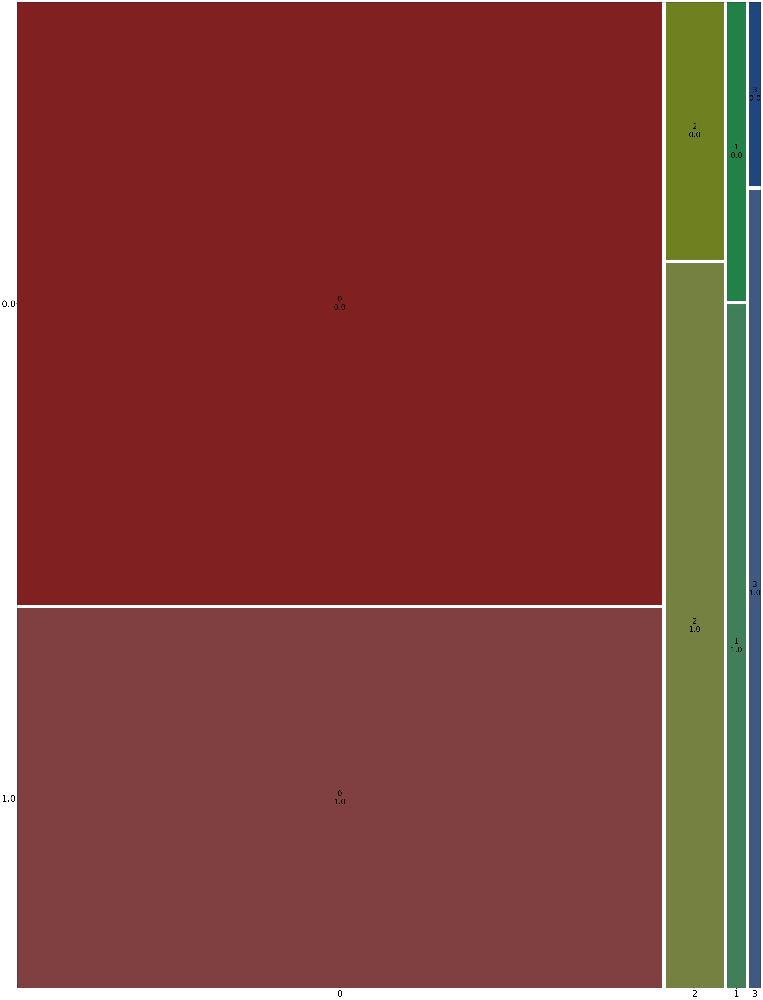

<Figure size 6000x8000 with 0 Axes>

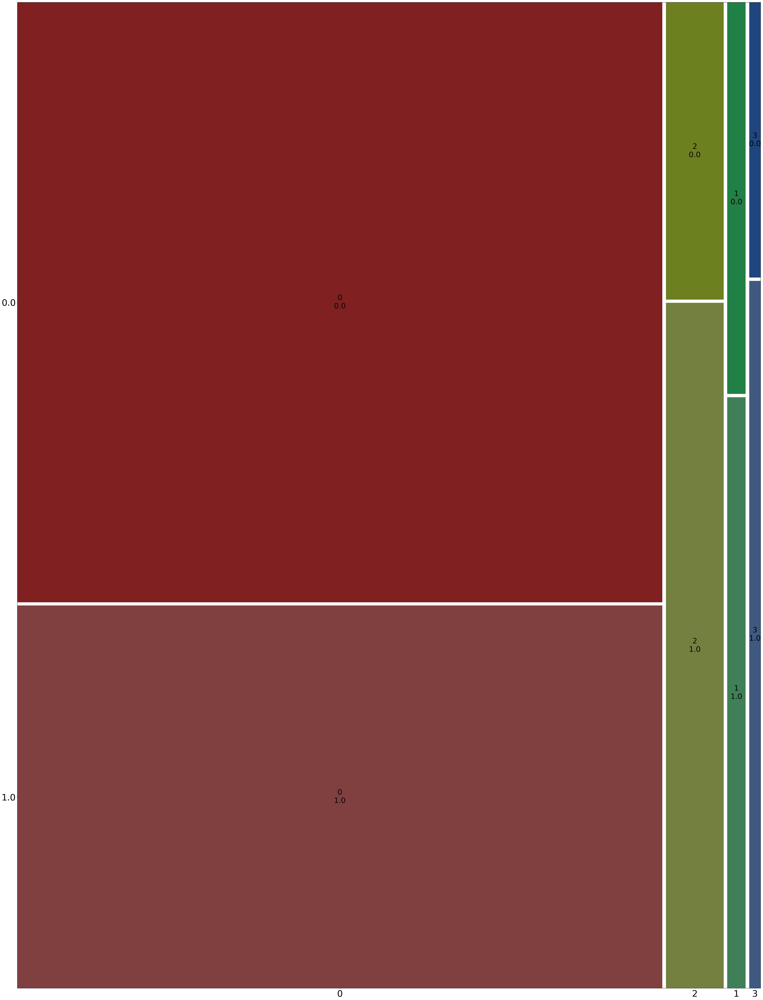

<Figure size 6000x8000 with 0 Axes>

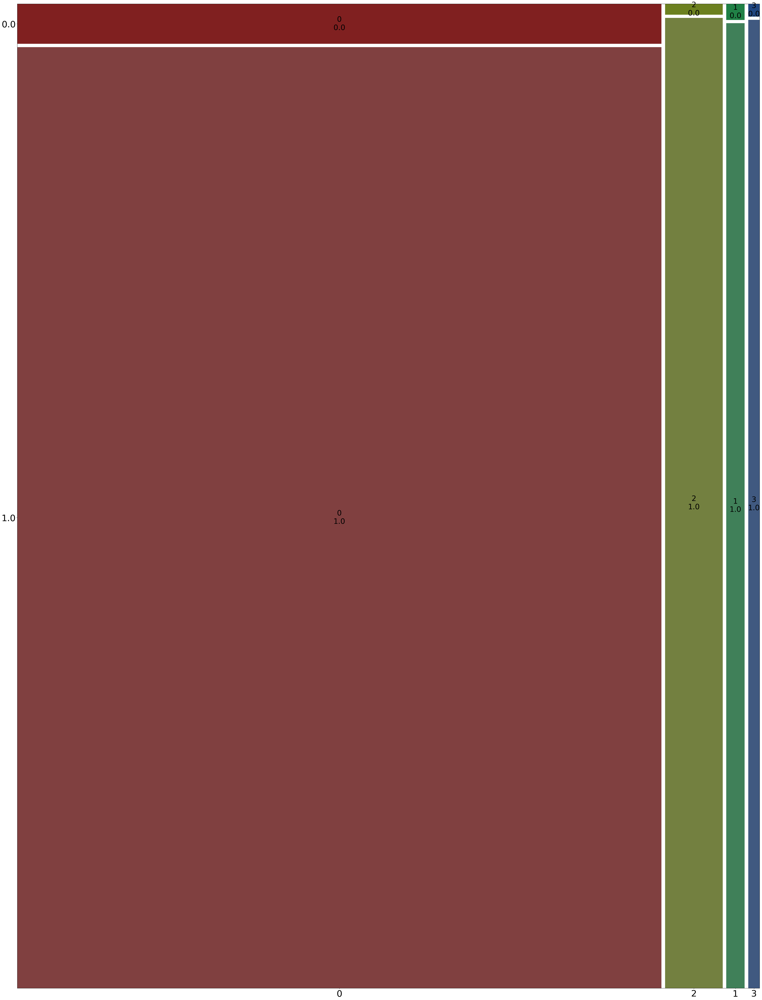

<Figure size 6000x8000 with 0 Axes>

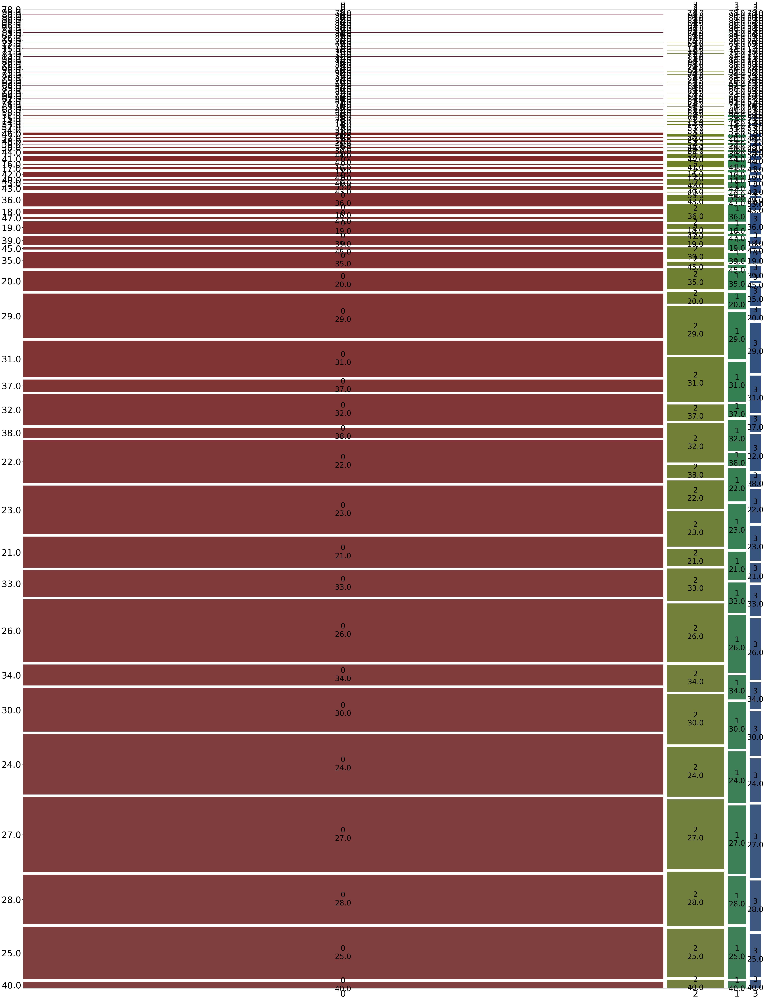

<Figure size 6000x8000 with 0 Axes>

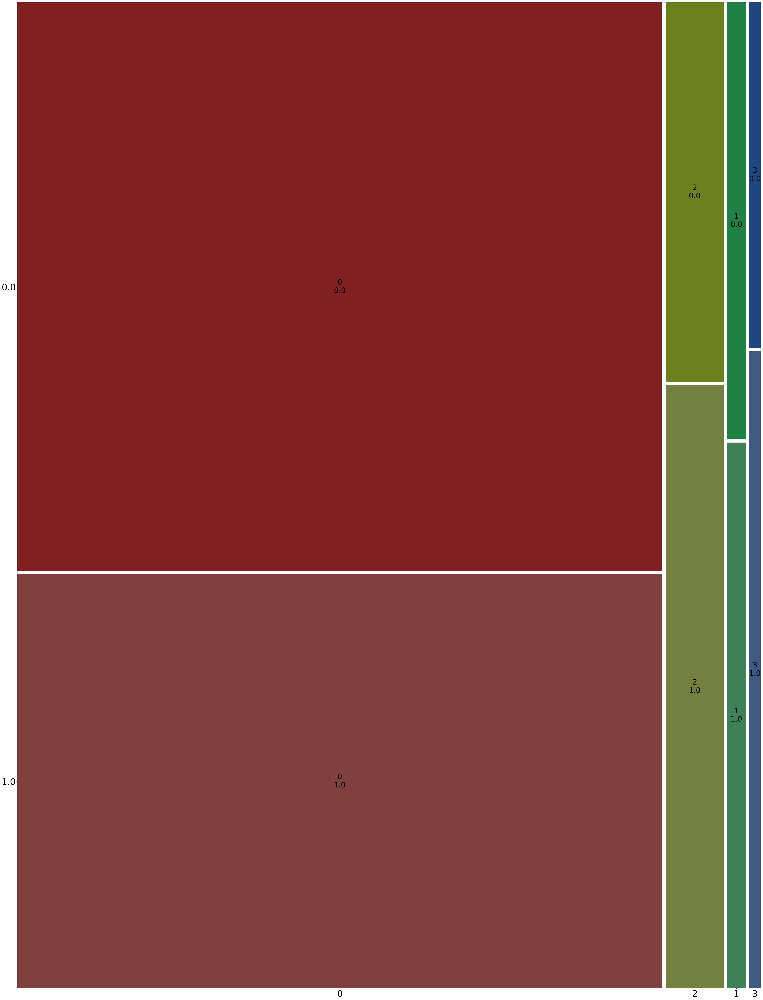

<Figure size 6000x8000 with 0 Axes>

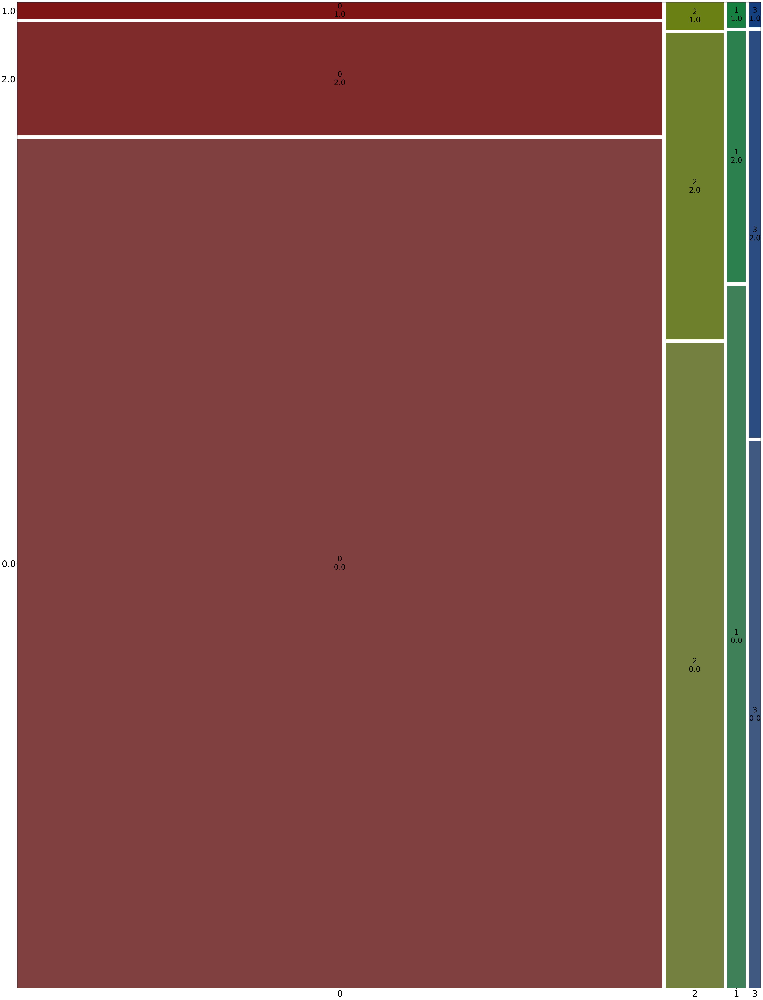

<Figure size 6000x8000 with 0 Axes>

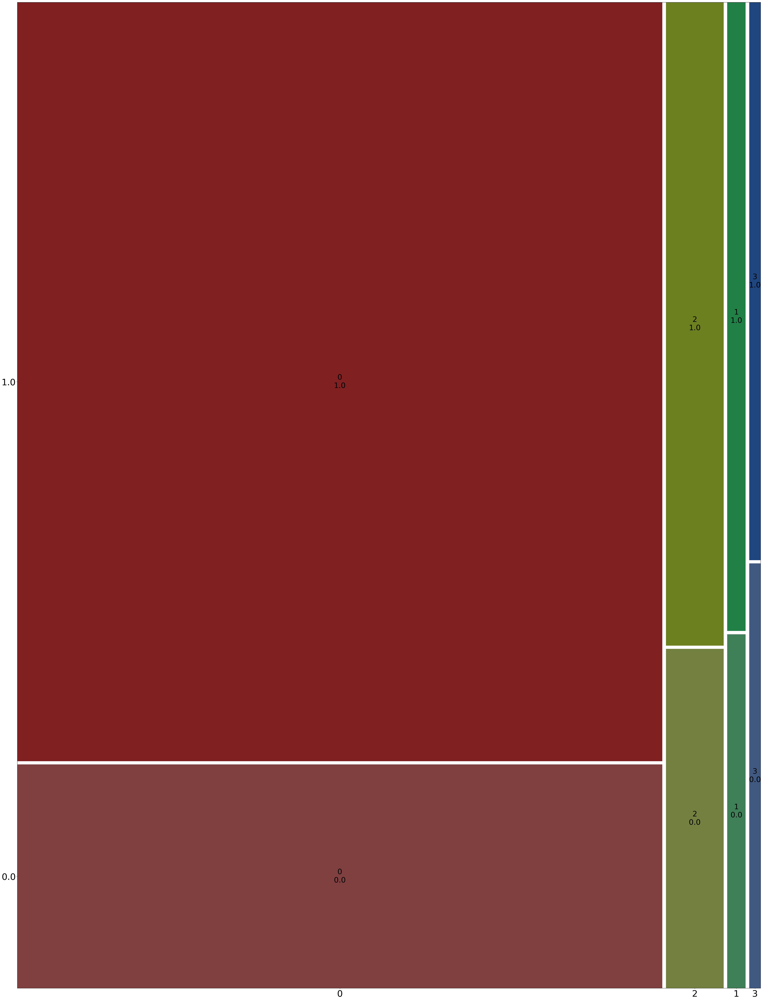

<Figure size 6000x8000 with 0 Axes>

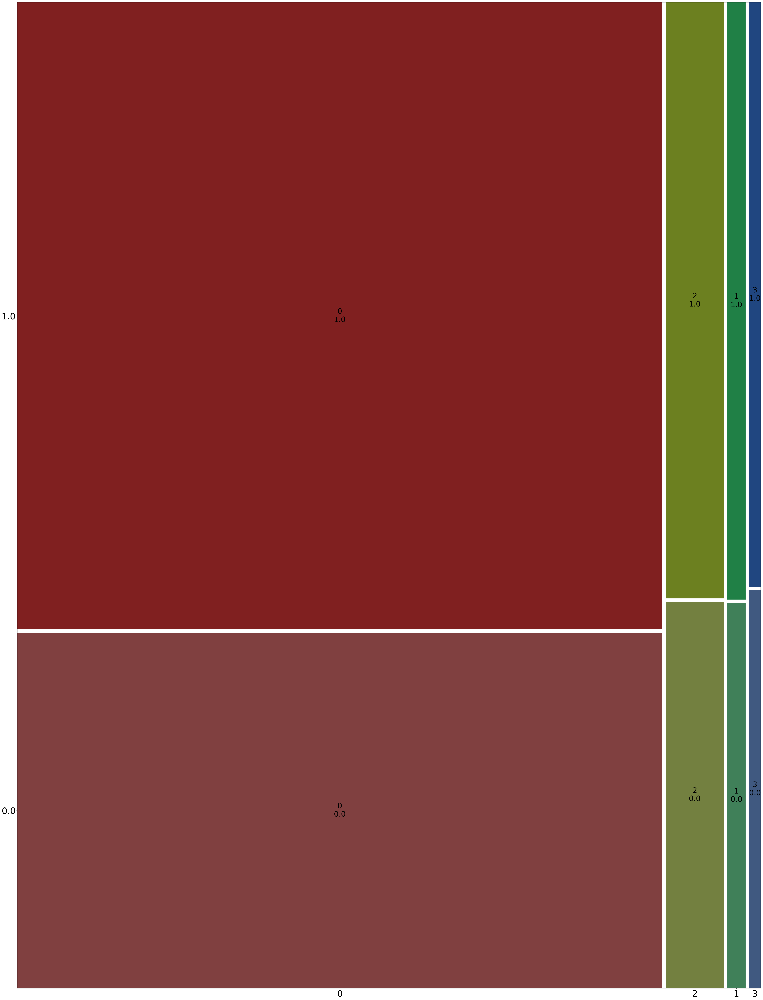

<Figure size 6000x8000 with 0 Axes>

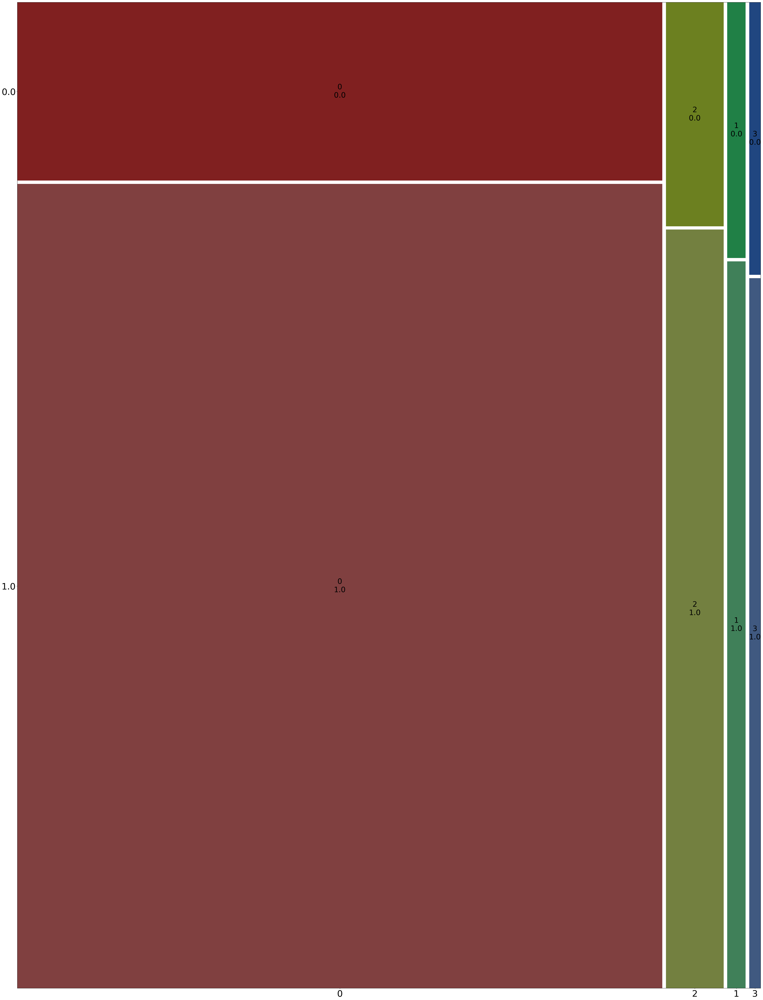

<Figure size 6000x8000 with 0 Axes>

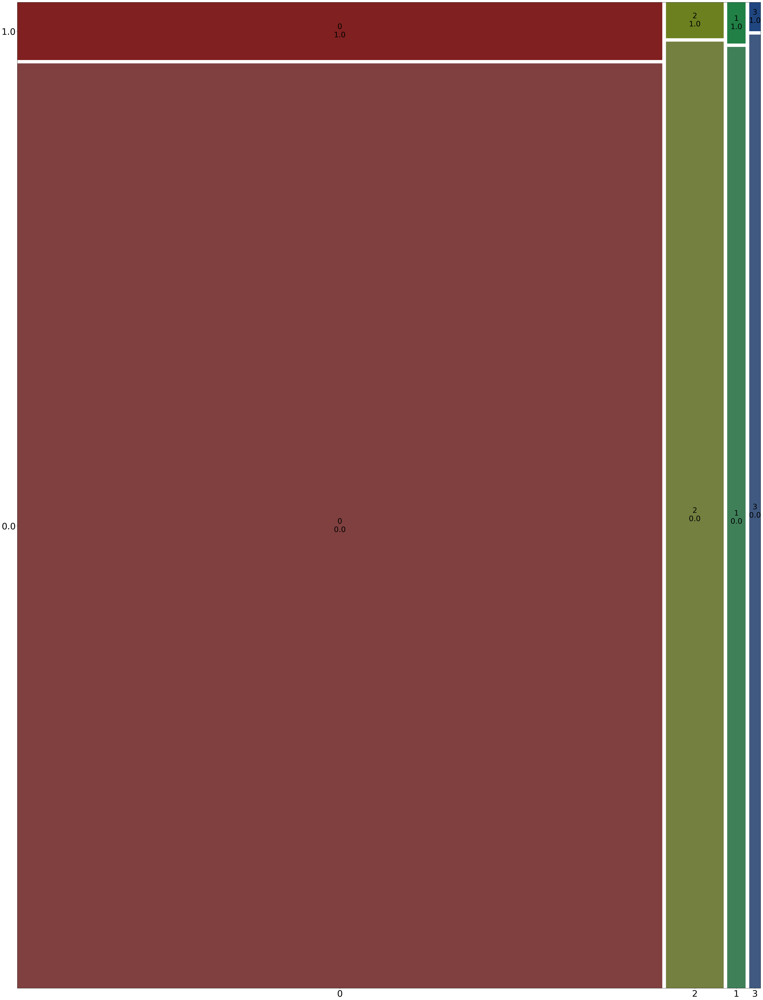

<Figure size 6000x8000 with 0 Axes>

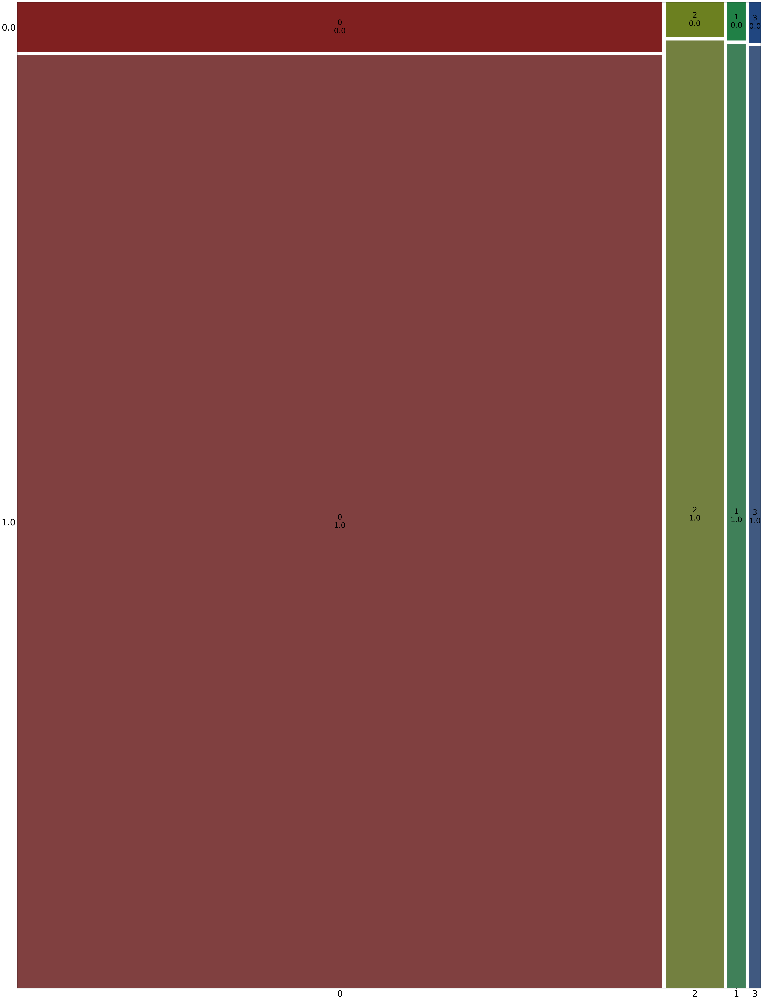

<Figure size 6000x8000 with 0 Axes>

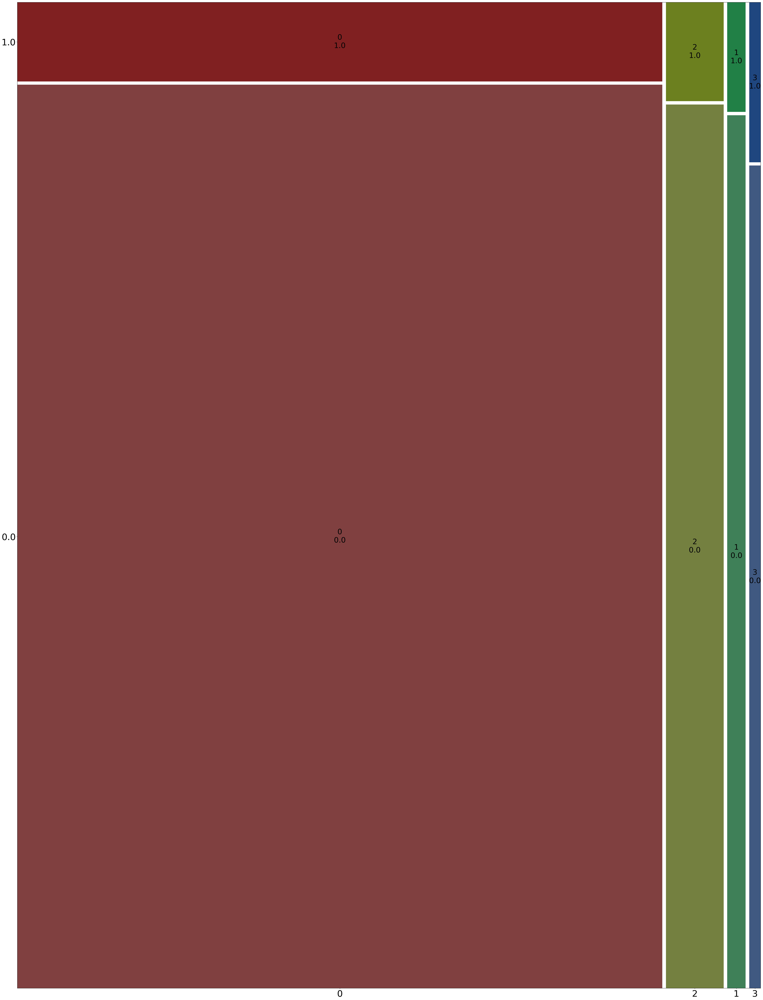

<Figure size 6000x8000 with 0 Axes>

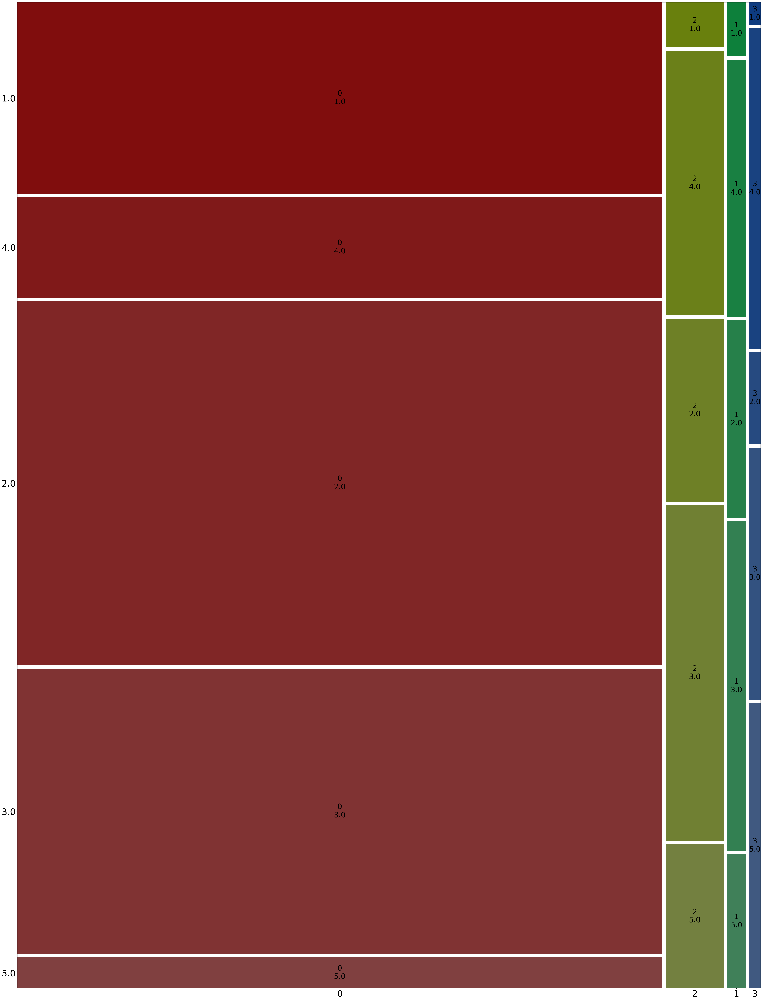

<Figure size 6000x8000 with 0 Axes>

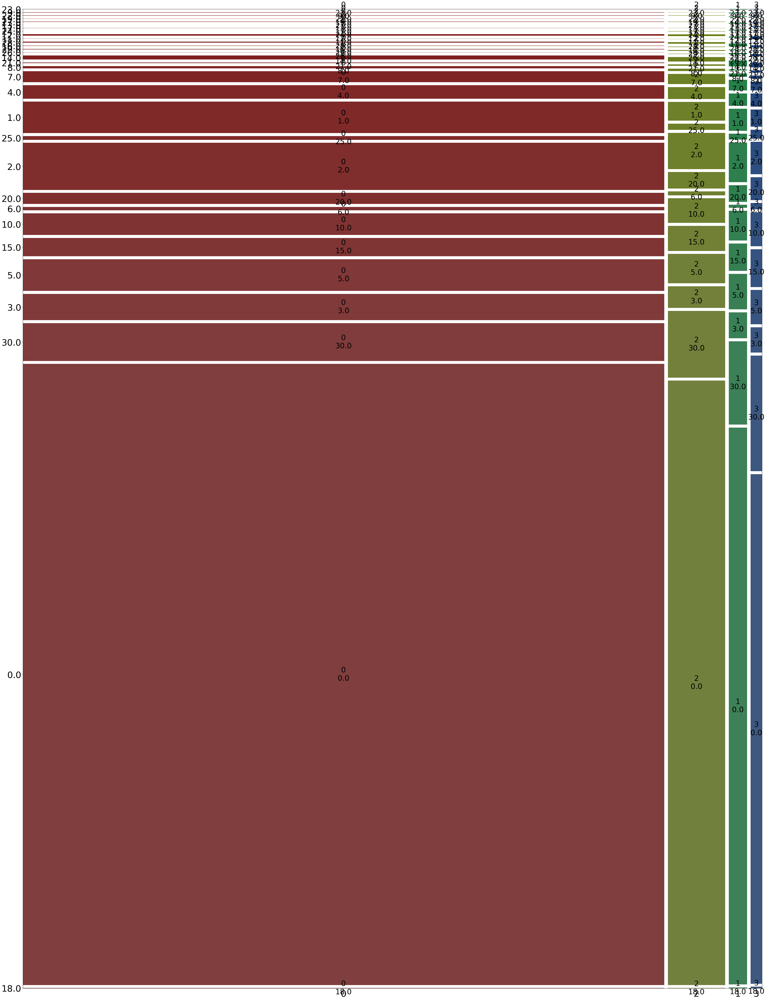

<Figure size 6000x8000 with 0 Axes>

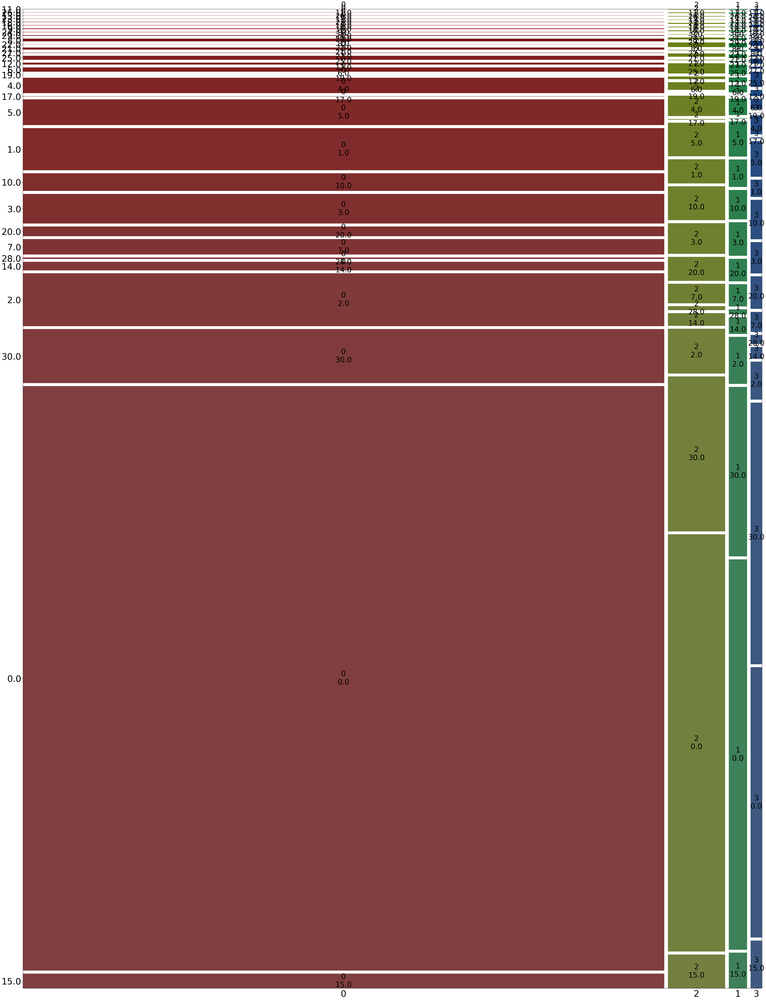

<Figure size 6000x8000 with 0 Axes>

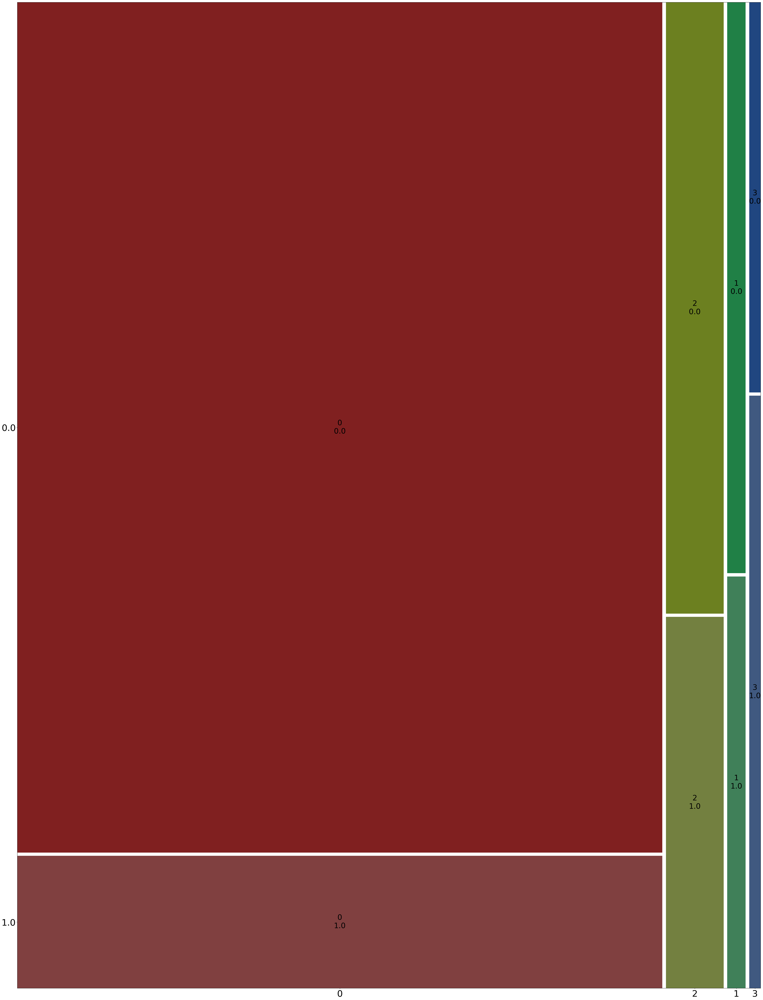

<Figure size 6000x8000 with 0 Axes>

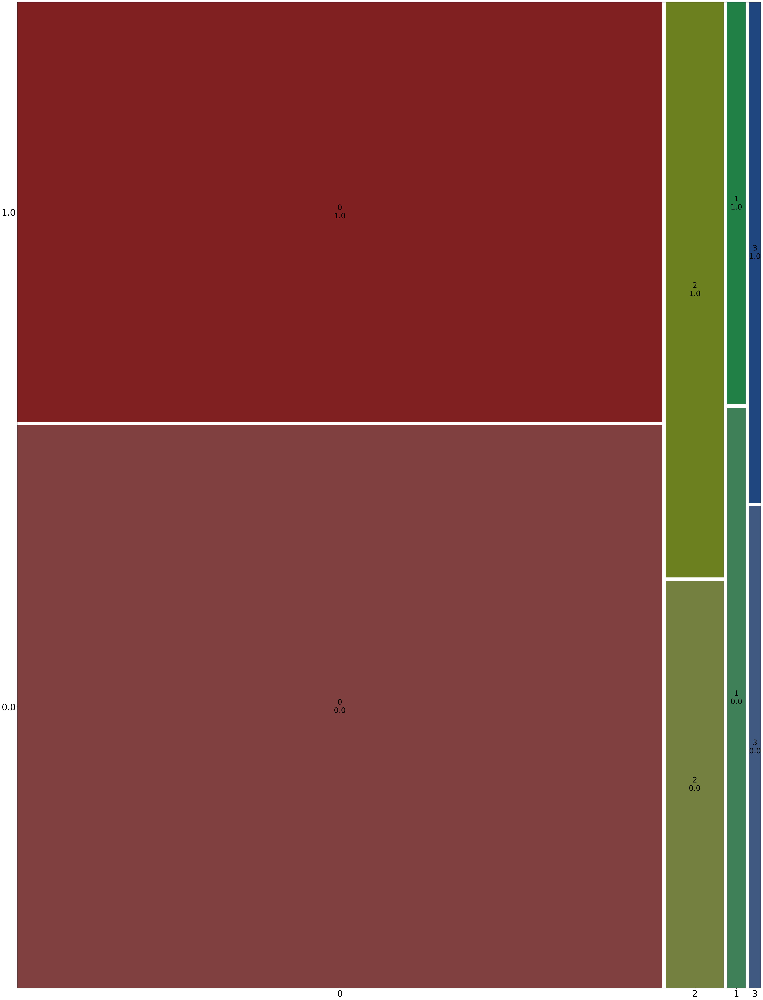

<Figure size 6000x8000 with 0 Axes>

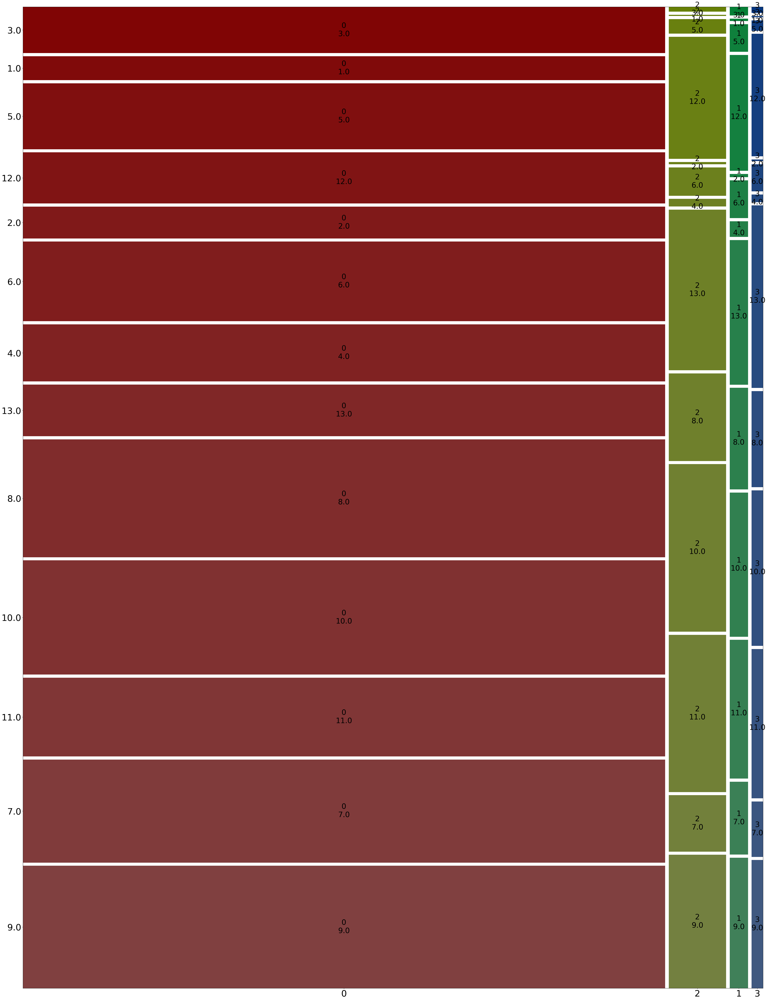

<Figure size 6000x8000 with 0 Axes>

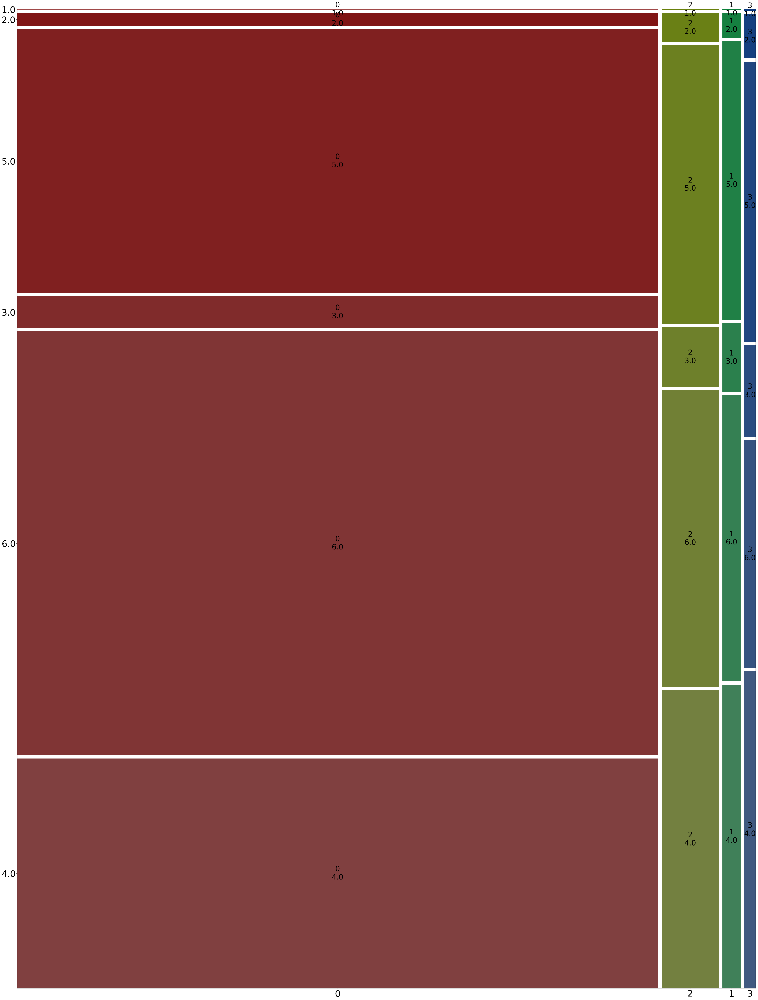

<Figure size 6000x8000 with 0 Axes>

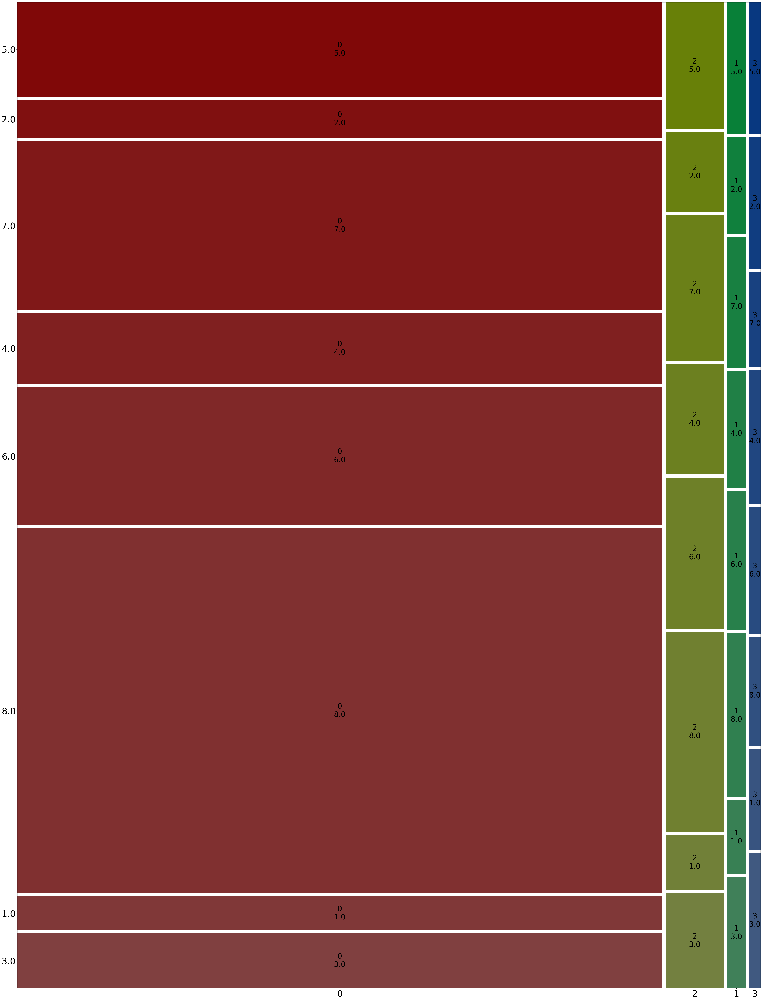

<Figure size 6000x8000 with 0 Axes>

In [61]:
lst_col= heart_df.drop(['HeartDiseaseorAttack', 'Stroke'], axis =1).columns
for col in lst_col:
    print(col,mosaic_plot(HD_comb, 'HD_Stroke', col))

(<Figure size 6000x8000 with 3 Axes>,
 {('0', '8'): (0.0, 0.0, 0.8677469617671228, 0.018928023799600027),
  ('0', '4'): (0.0,
   0.022164269754292584,
   0.8677469617671228,
   0.1606839743079452),
  ('0', '2'): (0.0,
   0.18608449001693037,
   0.8677469617671228,
   0.20683515446762193),
  ('0', '3'): (0.0,
   0.3961558904392449,
   0.8677469617671228,
   0.15671673699641286),
  ('0', '5'): (0.0,
   0.5561088733903502,
   0.8677469617671228,
   0.12427490373474771),
  ('0', '6'): (0.0,
   0.6836200230797906,
   0.8677469617671228,
   0.06111631192409874),
  ('0', '0'): (0.0,
   0.7479725809585819,
   0.8677469617671228,
   0.10869274272800626),
  ('0', '9'): (0.0,
   0.8599015696412806,
   0.8677469617671228,
   0.011914747763659977),
  ('0', '7'): (0.0,
   0.8750525633596331,
   0.8677469617671228,
   0.03952028844292069),
  ('0', '1'): (0.0,
   0.9178090977572465,
   0.8677469617671228,
   0.08219090224275354),
  ('2', '8'): (0.8726730701415071,
   0.0,
   0.0775034836953735,
   0.0

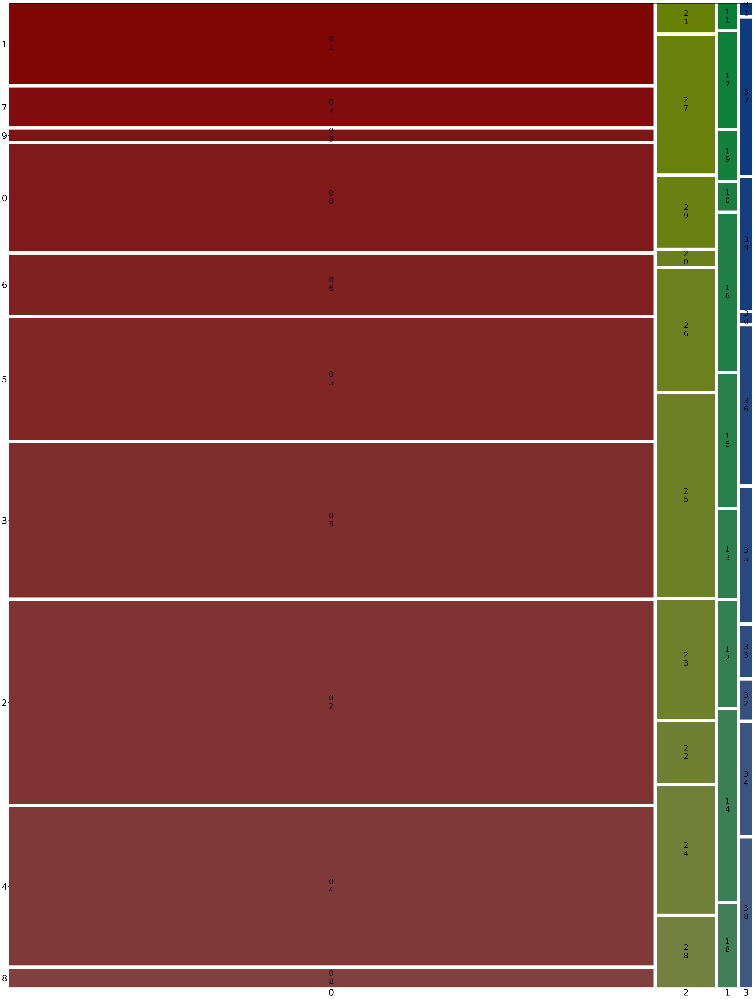

<Figure size 6000x8000 with 0 Axes>

In [69]:
mosaic_plot(HD_comb, 'HD_Stroke', 'GenHlth_Sex')

(<Figure size 640x480 with 3 Axes>,
 {('0.0', '5.0'): (0.0, 0.0, 0.9013078724949835, 0.03424510066874289),
  ('0.0', '3.0'): (0.0,
   0.03753457435295342,
   0.9013078724949835,
   0.29088150971849674),
  ('0.0', '2.0'): (0.0,
   0.3317055577556607,
   0.9013078724949835,
   0.36485161429818425),
  ('0.0', '4.0'): (0.0,
   0.6998466457380554,
   0.9013078724949835,
   0.10668632942223617),
  ('0.0', '1.0'): (0.0,
   0.8098224488445022,
   0.9013078724949835,
   0.19017755115549798),
  ('1.0', '5.0'): (0.9062829968730929,
   0.0,
   0.09371700312690721,
   0.1696296206552459),
  ('1.0', '3.0'): (0.9062829968730929,
   0.1729190943394564,
   0.09371700312690721,
   0.32686847281850884),
  ('1.0', '2.0'): (0.9062829968730929,
   0.5030770408421759,
   0.09371700312690721,
   0.1704969744496847),
  ('1.0', '4.0'): (0.9062829968730929,
   0.6768634889760711,
   0.09371700312690721,
   0.2778836347135365),
  ('1.0', '1.0'): (0.9062829968730929,
   0.9580365973738181,
   0.09371700312690721,


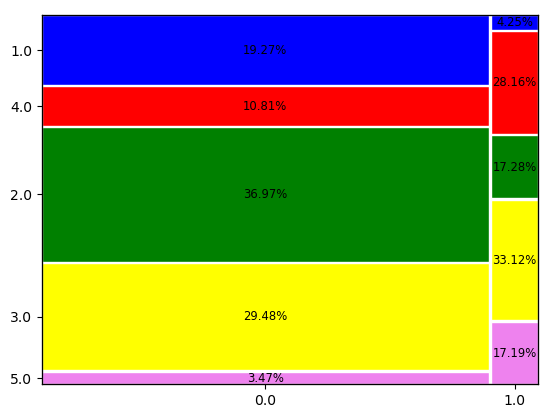

In [6]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','1.0')]={'facecolor':'Blue', 'edgecolor':'white'}
props[('0.0','2.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('0.0','3.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('0.0','4.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('0.0','5.0')]={'facecolor':'Violet', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'Blue', 'edgecolor':'white'}
props[('1.0','2.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('1.0','3.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('1.0','4.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('1.0','5.0')]={'facecolor':'Violet', 'edgecolor':'white'}


labelizer=lambda k:{('0.0','1.0'):'19.27%',('0.0','2.0'):'36.97%',('0.0','3.0'):'29.48%',('0.0','4.0'):'10.81%',
                    ('0.0','5.0'):'3.47%',('1.0','1.0'):'4.25%',('1.0','2.0'):'17.28%',('1.0','3.0'):"33.12%",
                    ('1.0','4.0'):"28.16%",('1.0','5.0'):'17.19%'}[k]
mosaic(heart_df,['HeartDiseaseorAttack','GenHlth'],labelizer=labelizer,properties=props)

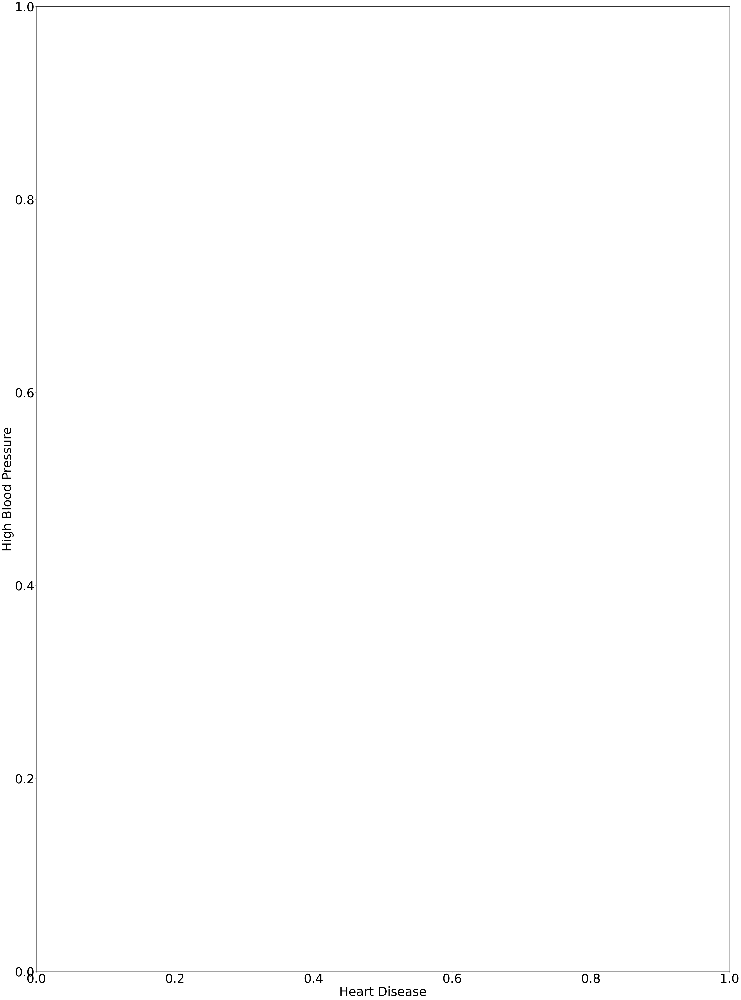

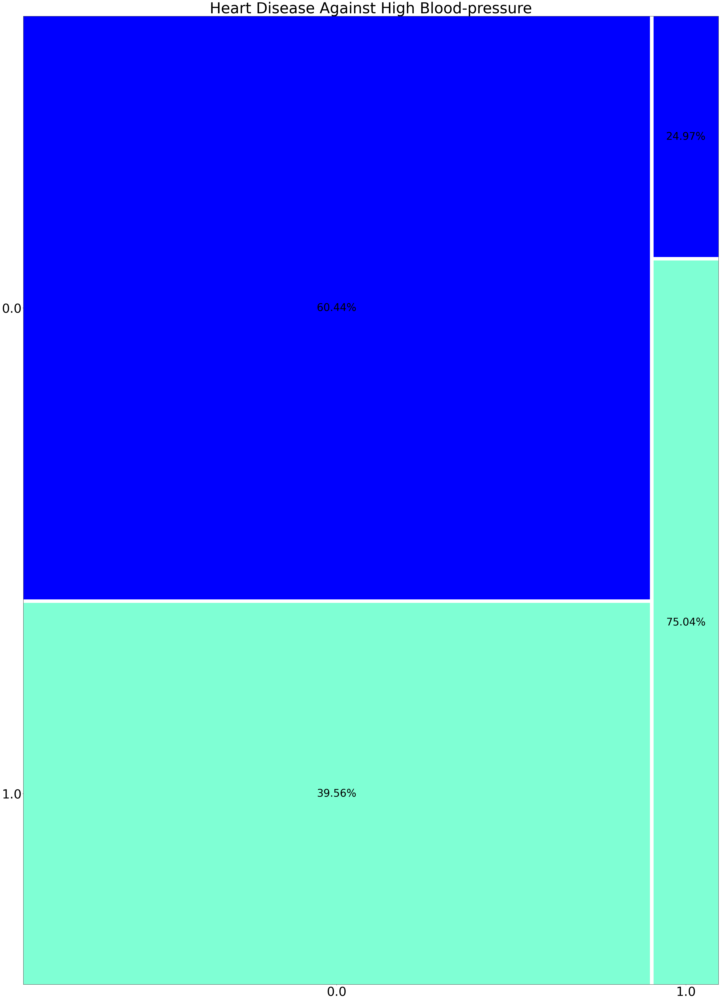

In [28]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','0.0')]={'facecolor':'blue', 'edgecolor':'white'}
props[('0.0','1.0')]={'facecolor':'Aquamarine', 'edgecolor':'white'}
props[('1.0','0.0')]={'facecolor':'blue', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'Aquamarine', 'edgecolor':'white'}
labelizer=lambda k:{('0.0','0.0'):'60.44%',('0.0','1.0'):'39.56%',('1.0','0.0'):'24.97%',('1.0','1.0'):'75.04%'}[k]

plt.xlabel("Heart Disease")
plt.ylabel("High Blood Pressure")
mosaic(heart_df,['HeartDiseaseorAttack','HighBP'],axes_label=True,title='Heart Disease Against High Blood-pressure',labelizer=labelizer,properties=props)

plt.show()

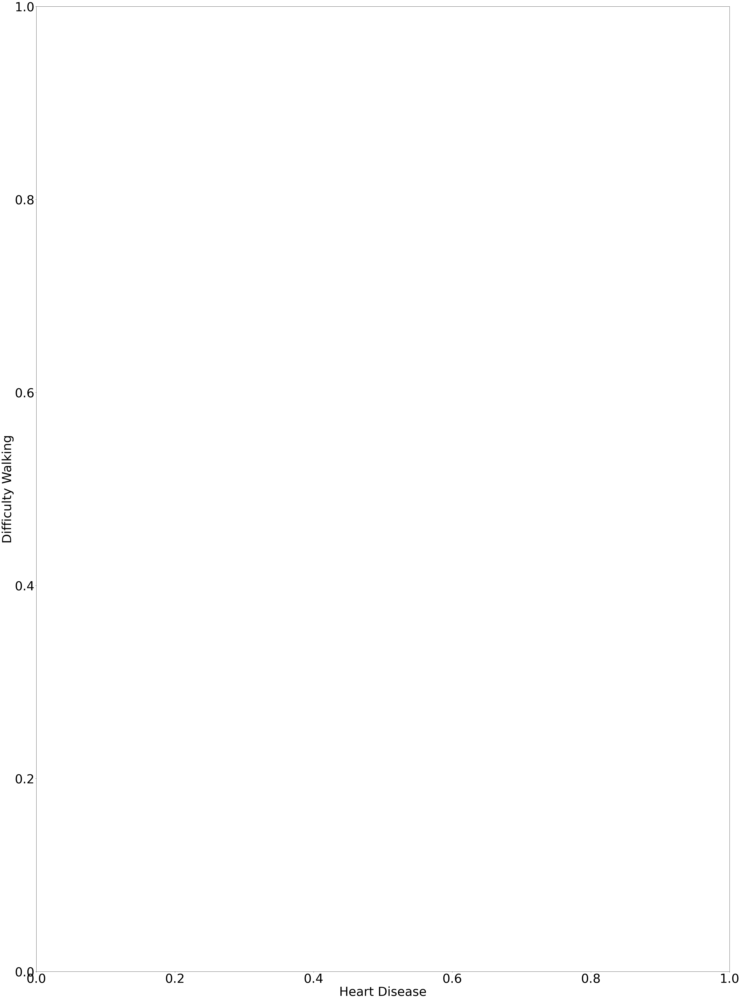

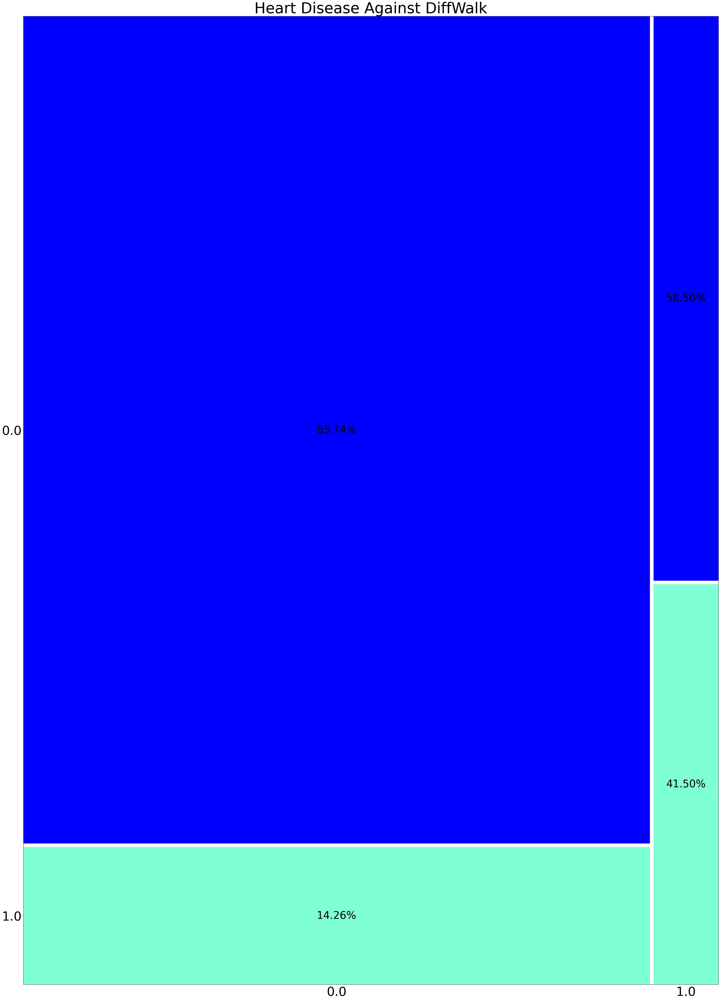

In [27]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','0.0')]={'facecolor':'blue', 'edgecolor':'white'}
props[('0.0','1.0')]={'facecolor':'Aquamarine', 'edgecolor':'white'}
props[('1.0','0.0')]={'facecolor':'blue', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'Aquamarine', 'edgecolor':'white'}
labelizer=lambda k:{('0.0','0.0'):'85.74%',('0.0','1.0'):'14.26%',('1.0','0.0'):'58.50%',('1.0','1.0'):'41.50%'}[k]

plt.xlabel("Heart Disease")
plt.ylabel("Difficulty Walking")
mosaic(heart_df,['HeartDiseaseorAttack','DiffWalk'],axes_label=True,
       title='Heart Disease Against DiffWalk',labelizer= labelizer,properties=props)

plt.show()

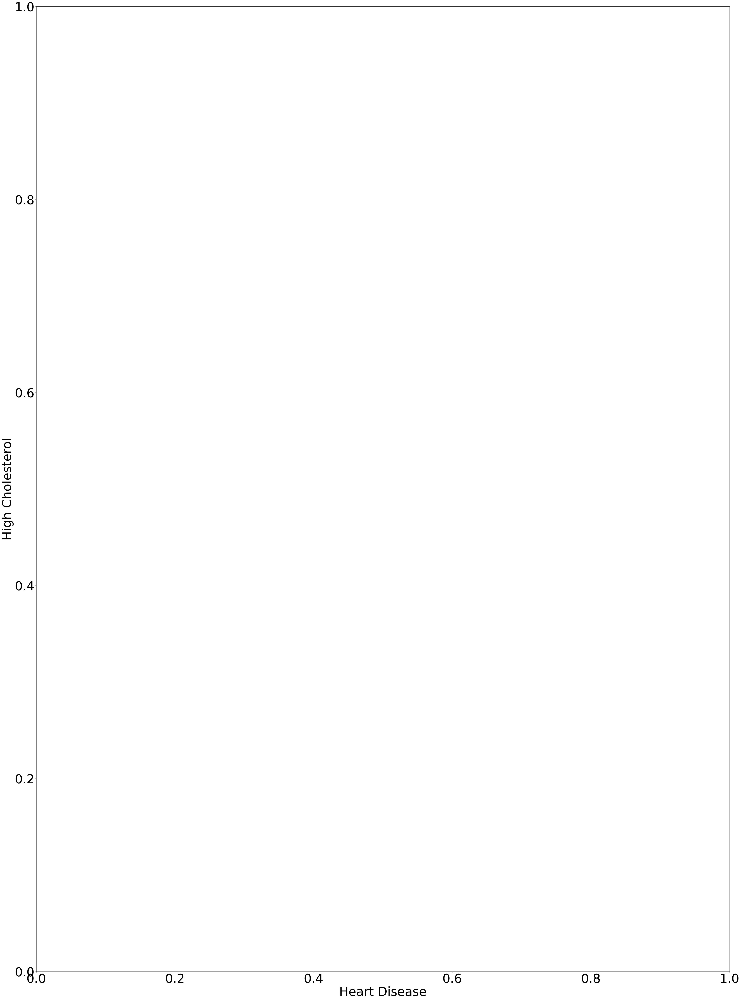

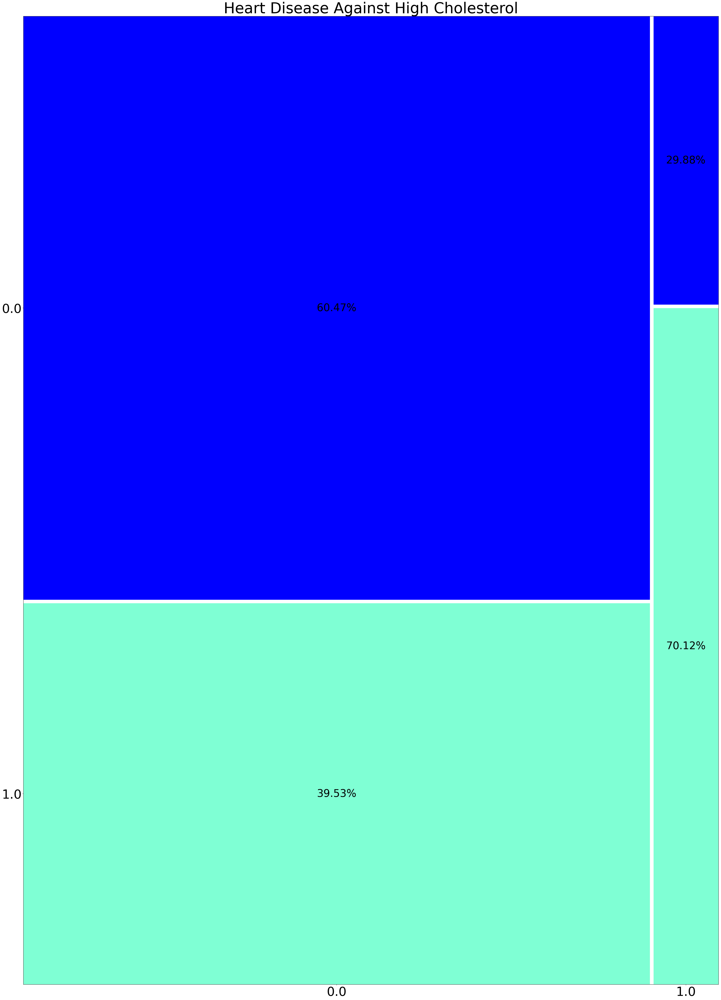

In [29]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','0.0')]={'facecolor':'blue', 'edgecolor':'white'}
props[('0.0','1.0')]={'facecolor':'Aquamarine', 'edgecolor':'white'}
props[('1.0','0.0')]={'facecolor':'blue', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'Aquamarine', 'edgecolor':'white'}
labelizer=lambda k:{('0.0','0.0'):'60.47%',('0.0','1.0'):'39.53%',('1.0','0.0'):'29.88%',('1.0','1.0'):'70.12%'}[k]

plt.xlabel("Heart Disease")
plt.ylabel("High Cholesterol")
mosaic(heart_df,['HeartDiseaseorAttack','HighChol'],axes_label=True,
       title='Heart Disease Against High Cholesterol',labelizer= labelizer,properties=props)

plt.show()

(<Figure size 5000x7000 with 3 Axes>,
 {('0.0', '9.0'): (0.0, 0.0, 0.9013078724949835, 0.12505728549281925),
  ('0.0', '7.0'): (0.0,
   0.12826241369794747,
   0.9013078724949835,
   0.10414745294220636),
  ('0.0', '11.0'): (0.0,
   0.235614994845282,
   0.9013078724949835,
   0.08195717036948265),
  ('0.0', '10.0'): (0.0,
   0.32077729341989286,
   0.9013078724949835,
   0.11716954597752897),
  ('0.0', '8.0'): (0.0,
   0.44115196760255004,
   0.9013078724949835,
   0.11958817379707161),
  ('0.0', '13.0'): (0.0,
   0.5639452696047499,
   0.9013078724949835,
   0.055251836901799745),
  ('0.0', '4.0'): (0.0,
   0.6224022347116779,
   0.9013078724949835,
   0.05703442418748325),
  ('0.0', '6.0'): (0.0,
   0.6826417871042892,
   0.9013078724949835,
   0.07995280579238763),
  ('0.0', '2.0'): (0.0,
   0.765799721101805,
   0.9013078724949835,
   0.03156769596994682),
  ('0.0', '12.0'): (0.0,
   0.8005725452768802,
   0.9013078724949835,
   0.05392535763052804),
  ('0.0', '5.0'): (0.0,
   0.8

<Figure size 20000x1000 with 0 Axes>

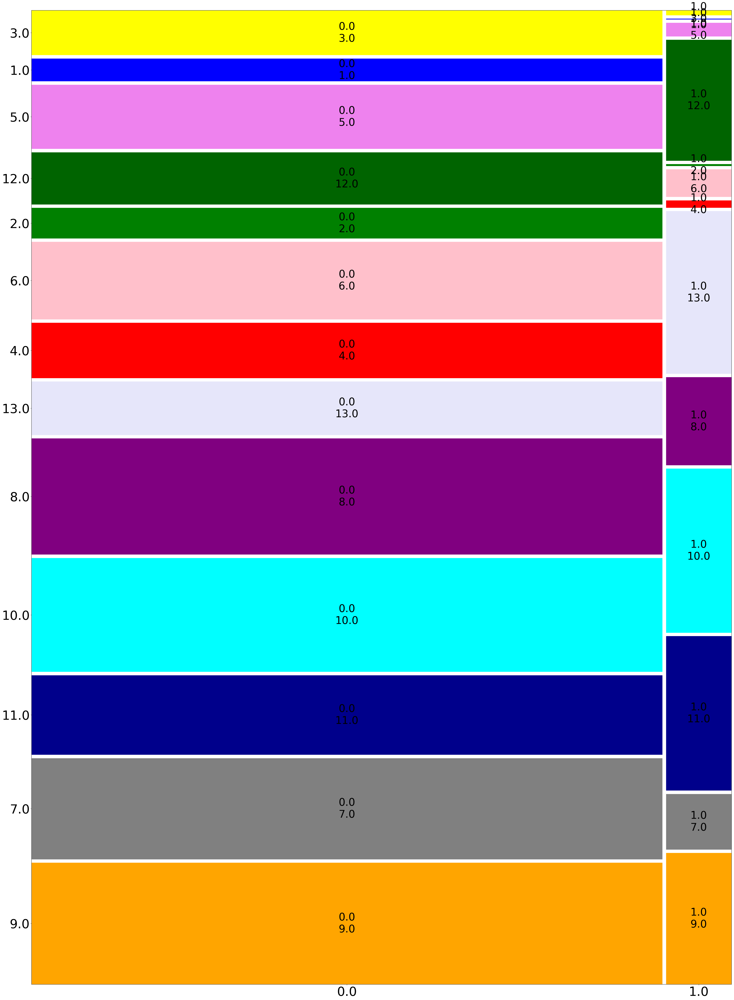

In [11]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','1.0')]={'facecolor':'Blue', 'edgecolor':'white'}
props[('0.0','2.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('0.0','3.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('0.0','4.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('0.0','5.0')]={'facecolor':'Violet', 'edgecolor':'white'}
props[('0.0','6.0')]={'facecolor':'pink', 'edgecolor':'white'}
props[('0.0','7.0')]={'facecolor':'gray', 'edgecolor':'white'}
props[('0.0','8.0')]={'facecolor':'purple', 'edgecolor':'white'}
props[('0.0','9.0')]={'facecolor':'orange', 'edgecolor':'white'}
props[('0.0','10.0')]={'facecolor':'aqua', 'edgecolor':'white'}
props[('0.0','11.0')]={'facecolor':'darkblue', 'edgecolor':'white'}
props[('0.0','12.0')]={'facecolor':'darkgreen', 'edgecolor':'white'}
props[('0.0','13.0')]={'facecolor':'lavender', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'Blue', 'edgecolor':'white'}
props[('1.0','2.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('1.0','3.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('1.0','4.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('1.0','5.0')]={'facecolor':'Violet', 'edgecolor':'white'}
props[('1.0','6.0')]={'facecolor':'pink', 'edgecolor':'white'}
props[('1.0','7.0')]={'facecolor':'gray', 'edgecolor':'white'}
props[('1.0','8.0')]={'facecolor':'purple', 'edgecolor':'white'}
props[('1.0','9.0')]={'facecolor':'orange', 'edgecolor':'white'}
props[('1.0','10.0')]={'facecolor':'aqua', 'edgecolor':'white'}
props[('1.0','11.0')]={'facecolor':'darkblue', 'edgecolor':'white'}
props[('1.0','12.0')]={'facecolor':'darkgreen', 'edgecolor':'white'}
props[('1.0','13.0')]={'facecolor':'lavender', 'edgecolor':'white'}




plt.figure(figsize=(200,10))
plt.rcParams["figure.figsize"]=(50, 70)
plt.rcParams['font.size'] = 50

mosaic(heart_df,['HeartDiseaseorAttack','Age'],properties=props)

(<Figure size 5000x7000 with 3 Axes>,
 {('0.0', '1.0'): (0.0, 0.0, 0.9013078724949835, 0.394000585866845),
  ('0.0', '0.0'): (0.0,
   0.39732284500305765,
   0.9013078724949835,
   0.6026771549969423),
  ('1.0', '1.0'): (0.9062829968730929,
   0.0,
   0.09371700312690721,
   0.6988382452053333),
  ('1.0', '0.0'): (0.9062829968730929,
   0.702160504341546,
   0.09371700312690721,
   0.29783949565845397)})

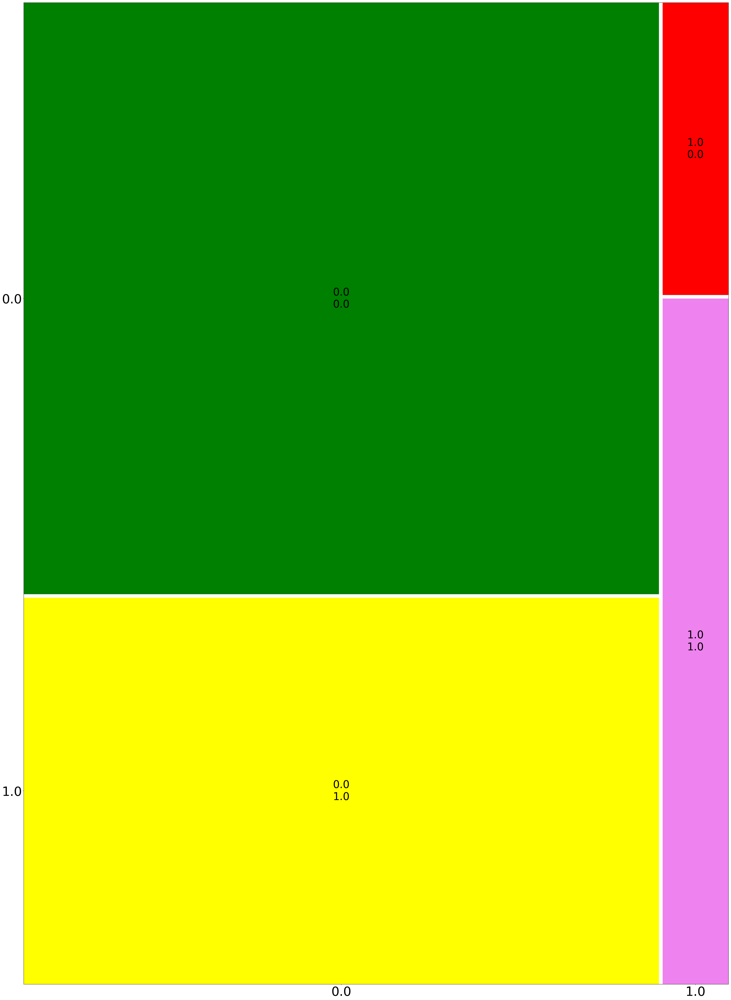

In [12]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','0.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('0.0','1.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('1.0','0.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'violet', 'edgecolor':'white'}

mosaic(heart_df,['HeartDiseaseorAttack','HighChol'],properties=props)

(<Figure size 5000x7000 with 3 Axes>,
 {('0.0', '0.0'): (0.0, 0.0, 0.9013078724949835, 0.8574828454004206),
  ('0.0', '2.0'): (0.0,
   0.8607941036785663,
   0.9013078724949835,
   0.11874515405672109),
  ('0.0', '1.0'): (0.0,
   0.9828505160134332,
   0.9013078724949835,
   0.017149483986566683),
  ('1.0', '0.0'): (0.9062829968730929,
   0.0,
   0.09371700312690721,
   0.6382345351502269),
  ('1.0', '2.0'): (0.9062829968730929,
   0.6415457934283725,
   0.09371700312690721,
   0.327536425504103),
  ('1.0', '1.0'): (0.9062829968730929,
   0.9723934772106213,
   0.09371700312690721,
   0.02760652278937863)})

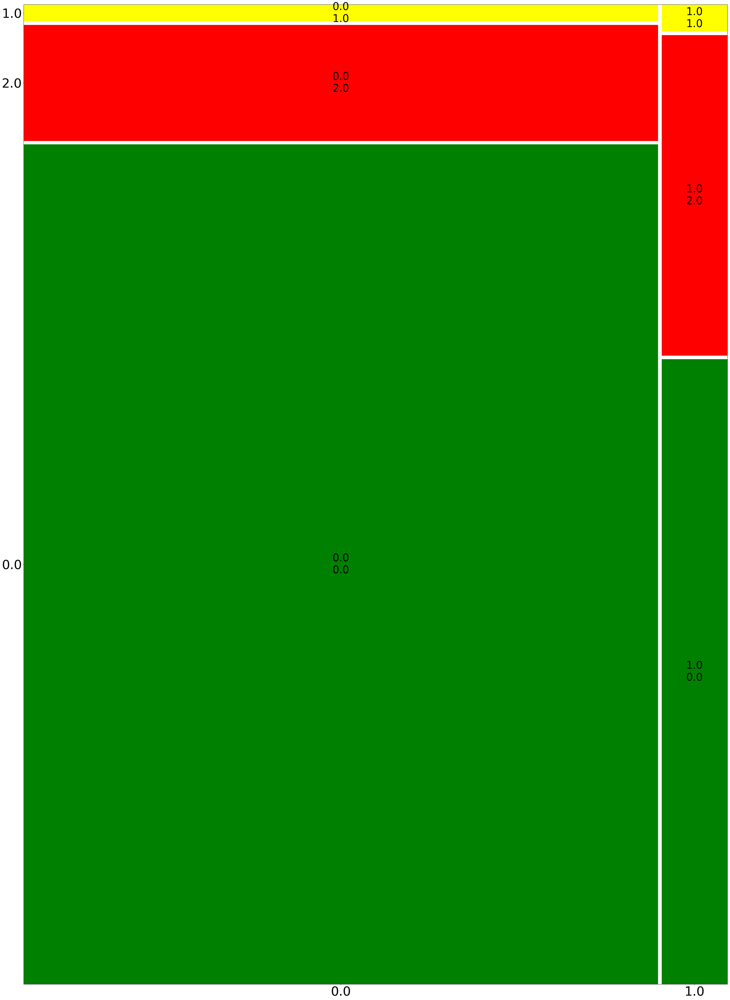

In [13]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','0.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('0.0','1.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('0.0','2.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('1.0','0.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('1.0','2.0')]={'facecolor':'Red', 'edgecolor':'white'}
mosaic(heart_df,['HeartDiseaseorAttack','Diabetes'], properties=props)

(<Figure size 5000x7000 with 3 Axes>,
 {('0.0', '0.0'): (0.0, 0.0, 0.9013078724949835, 0.9691135747308496),
  ('0.0', '1.0'): (0.0,
   0.9724358338670622,
   0.9013078724949835,
   0.027564166132937714),
  ('1.0', '0.0'): (0.9062829968730929,
   0.0,
   0.09371700312690721,
   0.8324488761008555),
  ('1.0', '1.0'): (0.9062829968730929,
   0.8357711352370681,
   0.09371700312690721,
   0.1642288647629318)})

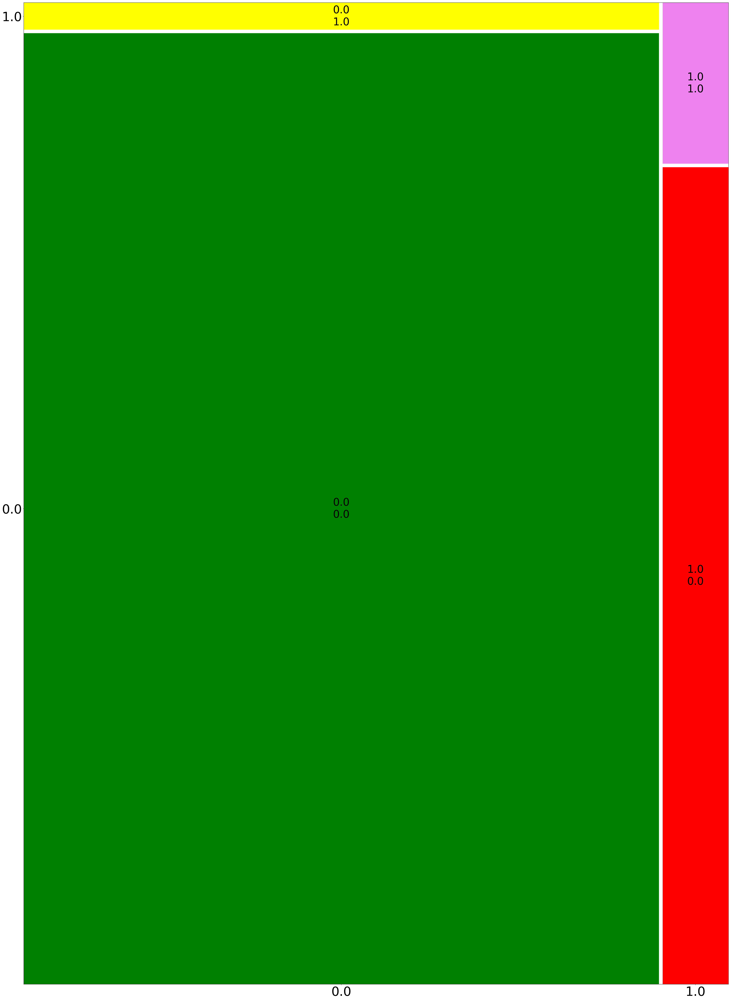

In [14]:
#This assigned the mosaic plot value for each mosaic
props={}
props[('0.0','0.0')]={'facecolor':'Green', 'edgecolor':'white'}
props[('0.0','1.0')]={'facecolor':'Yellow', 'edgecolor':'white'}
props[('1.0','0.0')]={'facecolor':'Red', 'edgecolor':'white'}
props[('1.0','1.0')]={'facecolor':'violet', 'edgecolor':'white'}


mosaic(heart_df,['HeartDiseaseorAttack','Stroke'], properties = props)

In [66]:
heart_df['Sex'].value_counts()

0.0    141974
1.0    111706
Name: Sex, dtype: int64

In [8]:
#Contigency table
df_crosstab = pd.crosstab(df_copy['HeartDiseaseorAttack'],df_copy['BMI'],margins = True)
df_crosstab

BMI,1,2,3,4,All
HeartDiseaseorAttack,,,,,
0.0,2796,64234,85035,77722,229787
1.0,331,4719,8714,10129,23893
All,3127,68953,93749,87851,253680


In [64]:
lst_col

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Diabetes',
       'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'AnyHealthcare', 'NoDocbcCost', 'GenHlth', 'MentHlth', 'PhysHlth',
       'DiffWalk', 'Sex', 'Age', 'Education', 'Income'],
      dtype='object')

In [9]:
df_crosstab = pd.crosstab(heart_df['HeartDiseaseorAttack'],heart_df['Stroke'],margins = True)
print(df_crosstab)

Stroke                   0.0    1.0     All
HeartDiseaseorAttack                       
0.0                   223432   6355  229787
1.0                    19956   3937   23893
All                   243388  10292  253680


In [17]:
#contigency tables
df_crosstab = pd.crosstab(heart_df['HeartDiseaseorAttack'],heart_df['DiffWalk'],margins = True)
print(df_crosstab)

DiffWalk                 0.0    1.0     All
HeartDiseaseorAttack                       
0.0                   197027  32760  229787
1.0                    13978   9915   23893
All                   211005  42675  253680


In [19]:
df_crosstab = pd.crosstab(heart_df['HeartDiseaseorAttack'],heart_df['HighBP'],margins = True)
print(df_crosstab)

HighBP                   0.0     1.0     All
HeartDiseaseorAttack                        
0.0                   138886   90901  229787
1.0                     5965   17928   23893
All                   144851  108829  253680


In [32]:
df_crosstab = pd.crosstab(heart_df['HeartDiseaseorAttack'],heart_df['GenHlth'],margins = True)
print(df_crosstab)

GenHlth                 1.0    2.0    3.0    4.0    5.0     All
HeartDiseaseorAttack                                           
0.0                   44283  84956  67732  24842   7974  229787
1.0                    1016   4128   7914   6728   4107   23893
All                   45299  89084  75646  31570  12081  253680


In [5]:
df_crosstab = pd.crosstab(heart_df['HeartDiseaseorAttack'],heart_df['HighBP'],margins = True)
df_crosstab

HighBP,0.0,1.0,All
HeartDiseaseorAttack,,,
0.0,138886,90901,229787
1.0,5965,17928,23893
All,144851,108829,253680


In [30]:
#Original test for decision tree model with data splitting
train, test = train_test_split(heart_df, test_size=0.30)
X_train = train[["GenHlth","Age","HighBP","DiffWalk","HighChol"]]
y_train = train[["HeartDiseaseorAttack"]]
X_test = test[["GenHlth","Age","HighBP","DiffWalk","HighChol"]]
y_test = test[["HeartDiseaseorAttack"]]

In [31]:
X_train.columns

Index(['GenHlth', 'Age', 'HighBP', 'DiffWalk', 'HighChol'], dtype='object')

In [32]:
#clf = tree.DecisionTreeClassifier(max_depth=8)
clf = tree.DecisionTreeClassifier()
clf=clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

In [12]:
#original entropy with built it function
pk = heart_df["HeartDiseaseorAttack"]

qk = heart_df.drop("HeartDiseaseorAttack", axis=1)
qk = qk.replace(to_replace=0.0, value=0.00001)

lst = qk.columns
lst_val = []
lst_names = []
for i in range(0, len(lst)):
    H = entropy(pk, qk = qk[lst[i]])
    lst_val.append(H)
    lst_names.append(lst[i])
    #print(H,lst[i])
    
entropy_df = pd.DataFrame([lst_val,lst_names]).T
entropy_df = entropy_df.sort_values(by =[0])
entropy_df.columns = ["entropy", "variable"]
entropy_df["entropy"] = entropy_df["entropy"].div(10)
entropy_df
#heart_df["HighBP"]

,entropy,variable
13,0.213267,GenHlth
18,0.216105,Age
3,0.234819,BMI
19,0.245459,Education
2,0.245503,CholCheck
20,0.265693,Income
11,0.273152,AnyHealthcare
0,0.439046,HighBP
9,0.487166,Veggies
1,0.49452,HighChol


In [13]:
entropy(heart_df["HeartDiseaseorAttack"])

10.081340807990532

In [14]:

#This splitted data set on a training and testing data set 
train, test = train_test_split(heart_df, test_size=0.20)
X_train = train[["GenHlth","Age","HighBP","DiffWalk","HighChol","BMI"]]
#X_train = X_train.replace(to_replace=0.0, value=0.00001)
y_train = train[["HeartDiseaseorAttack"]]
X_test = test[["GenHlth","Age","HighBP","DiffWalk","HighChol"]]
#X_test = X_test.replace(to_replace=0.0, value=0.00001)
y_test = test[["HeartDiseaseorAttack"]]

In [250]:
heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
#This resample the 1 and 0 on heart disease and takes a sample as large as one

HD_1_df = heart_df[heart_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = heart_df[heart_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0

for i in range(1000):
    HD_0_df = HD_0_df.sample(n = len(HD_1_df), replace=False)
    HD_1_df = HD_1_df.sample(n = len(HD_1_df), replace=False)
    #HD_1_df = pd.concat([HD_1_df, HD_1_df.sample(n = len(HD_1_df), replace=True)])

#HD_0_df = pd.concat([HD_0_df, HD_0_df.sample(n = len(HD_1_df), replace=True)])

df_2 = pd.concat([HD_0_df, HD_1_df])
one_train, one_test = train_test_split(HD_1_df, test_size=0.25)
zero_train, zero_test = train_test_split(HD_0_df, test_size=0.25)
train = pd.concat((one_train,zero_train))
test = pd.concat((one_test,zero_test))
X_train = train[["GenHlth","Age","HighBP","DiffWalk",'HighChol','PhysHlth']]
y_train = train[["HeartDiseaseorAttack"]]
X_test = test[["GenHlth","Age","HighBP","DiffWalk",'HighChol', 'PhysHlth']]
y_test = test[["HeartDiseaseorAttack"]]

(array([23893.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 23893.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

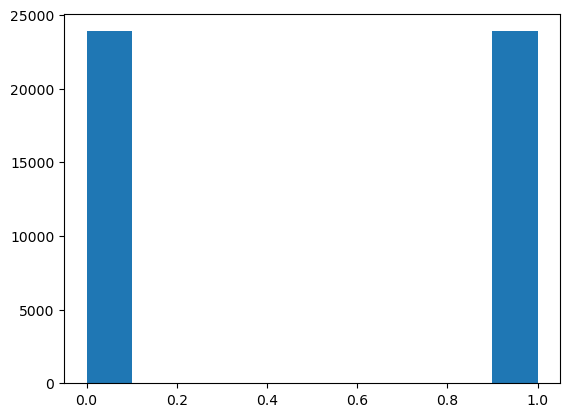

In [251]:
#Plotting the count the 1 an 0 in heart diseases
plt.hist(df_2['HeartDiseaseorAttack'])

In [257]:
#This creates our decision tree model
#clf = tree.DecisionTreeClassifier()
clf = tree.DecisionTreeClassifier(max_depth =  6,criterion='entropy')
#clf = tree.DecisionTreeClassifier(criterion='entropy')
clf=clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

         0.0       0.79      0.68      0.73      5974
         1.0       0.72      0.82      0.77      5974

    accuracy                           0.75     11948
   macro avg       0.76      0.75      0.75     11948
weighted avg       0.76      0.75      0.75     11948



### Decision Tree model one variable

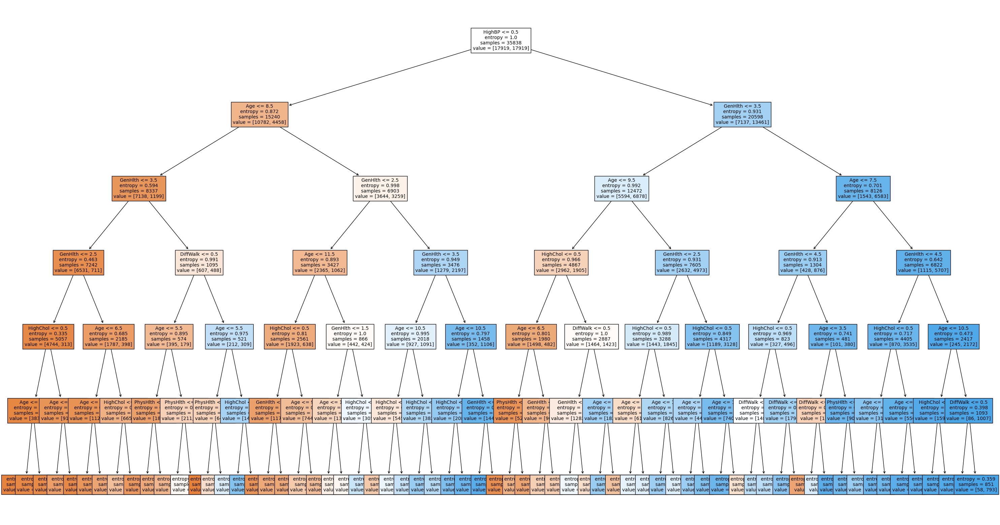

In [258]:
#This creates our plot for our decsion tree
plt.figure(figsize=(37,20))  # set plot size (denoted in inches)
tree.plot_tree(clf, feature_names=X_train.columns,fontsize=10,filled = True)
plt.show()

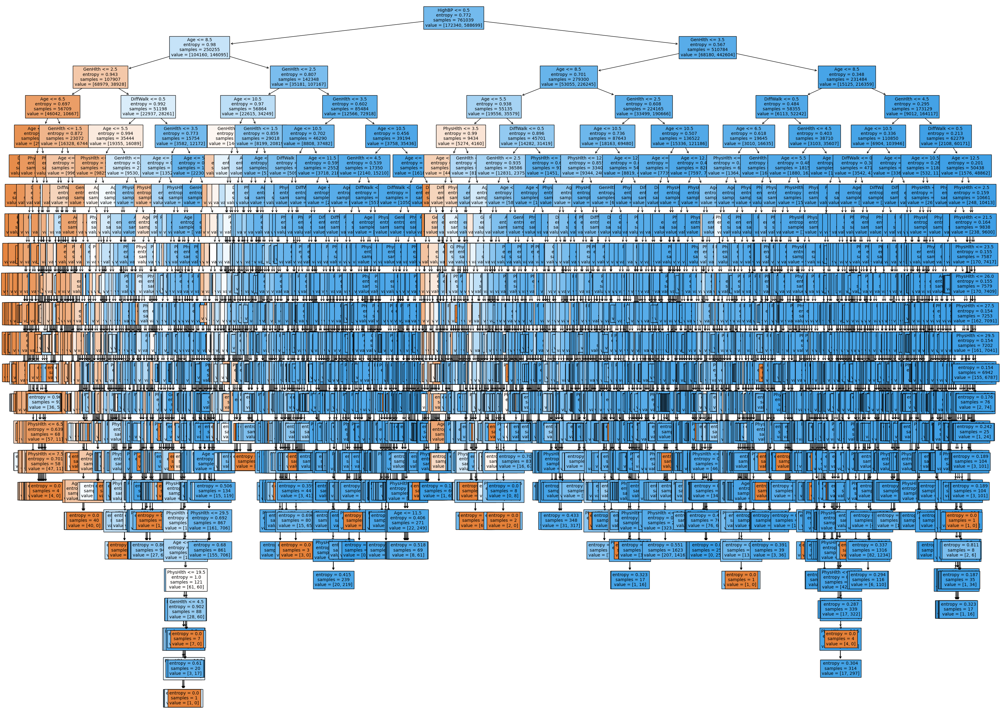

In [90]:
plt.figure(figsize=(40,30))  # set plot size (denoted in inches)
tree.plot_tree(clf, feature_names=X_train.columns,fontsize=10,filled = True)
plt.show()

In [259]:
#heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
#Decision tree model with fused variables

HD_1_df = HD_comb[HD_comb['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = HD_comb[HD_comb['HeartDiseaseorAttack']==0] # dataset only include HD == 0

for i in range(1000):
    HD_0_df = HD_0_df.sample(n = len(HD_1_df), replace=False)
    HD_1_df = HD_1_df.sample(n = len(HD_1_df), replace=False)

#HD_0_df = pd.concat([HD_0_df, HD_0_df.sample(n = len(HD_1_df), replace=True)])

df_2 = pd.concat([HD_0_df, HD_1_df])
one_train, one_test = train_test_split(HD_1_df, test_size=0.25)
zero_train, zero_test = train_test_split(HD_0_df, test_size=0.25)
train = pd.concat((one_train,zero_train))
test = pd.concat((one_test,zero_test))
X_train = train[["GenHlth_Age","PhysHlth_Age","HighBP_GenHlth","HighChol_GenHlth", "DiffWalk_Age",'HighBP_Age']]
y_train = train[["HeartDiseaseorAttack"]]
X_test = test[["GenHlth_Age","PhysHlth_Age","HighBP_GenHlth","HighChol_GenHlth", "DiffWalk_Age",'HighBP_Age']]
y_test = test[["HeartDiseaseorAttack"]]

In [260]:
#clf = tree.DecisionTreeClassifier()
clf = tree.DecisionTreeClassifier(max_depth =  6,criterion='entropy')
#clf = tree.DecisionTreeClassifier(criterion='entropy')
clf=clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

         0.0       0.80      0.67      0.73      5974
         1.0       0.72      0.83      0.77      5974

    accuracy                           0.75     11948
   macro avg       0.76      0.75      0.75     11948
weighted avg       0.76      0.75      0.75     11948



(array([229787.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 229787.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

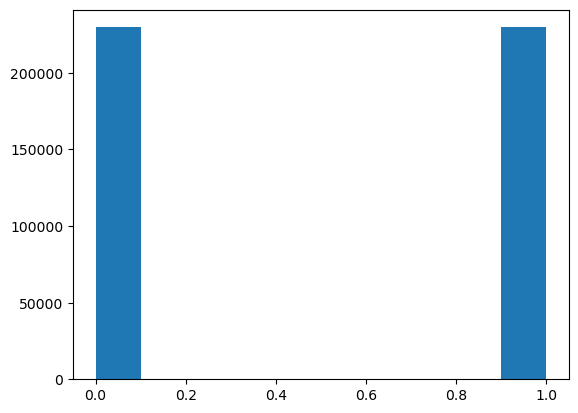

In [204]:
#Plotting the count the 1 an 0 in heart diseases
plt.hist(df_2["HeartDiseaseorAttack"])

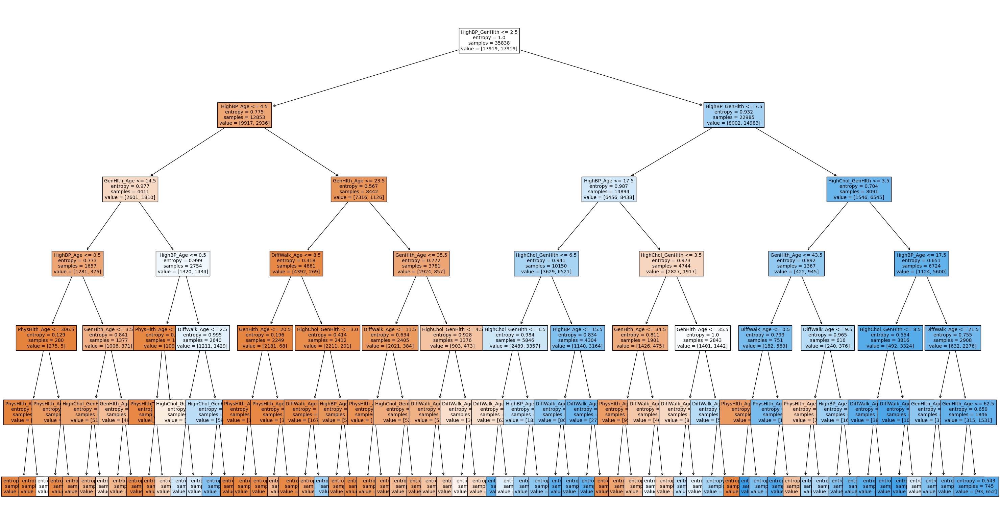

In [261]:
plt.figure(figsize=(37,20))  # set plot size (denoted in inches)
tree.plot_tree(clf, feature_names=X_train.columns,fontsize=10,filled = True)
plt.show()

(array([3937.,    0.,    0., 3937.,    0.,    0., 3937.,    0.,    0.,
        3937.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

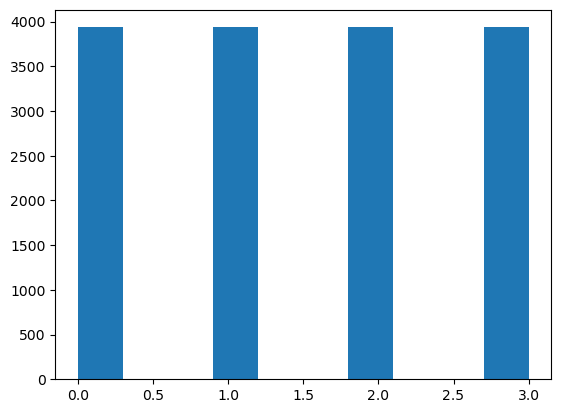

In [54]:
#heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
#Decision tree model with HD_Stroke againts fused variables

HD_1_df = HD_comb[HD_comb['HD_Stroke']==1] # dataset only include HD == 1
HD_0_df = HD_comb[HD_comb['HD_Stroke']==0] # dataset only include HD == 0
HD_2_df = HD_comb[HD_comb['HD_Stroke']==2] # dataset only include HD == 2
HD_3_df = HD_comb[HD_comb['HD_Stroke']==3] # dataset only include HD == 3



#for i in range(3):
 #   HD_1_df = pd.concat([HD_1_df, HD_1_df.sample(n = len(HD_1_df), replace=True)])
    
for i in range(10):
    HD_0_df = HD_0_df.sample(n = len(HD_3_df), replace=True)
    HD_1_df = HD_1_df.sample(n = len(HD_3_df), replace=True)
    HD_2_df = HD_2_df.sample(n = len(HD_3_df), replace=True)
    HD_3_df = HD_3_df.sample(n = len(HD_3_df), replace=True)
    
 #   HD_2_df = pd.concat([HD_2_df, HD_2_df.sample(n = len(HD_2_df), replace=True)])
    

    
#for i in range(2):
 #   HD_3_df = pd.concat([HD_3_df, HD_3_df.sample(n = len(HD_3_df), replace=True)])
    
#HD_0_df = pd.concat([HD_0_df, HD_0_df.sample(n = len(HD_1_df), replace=True)])

df_2 = pd.concat([HD_0_df, HD_1_df,HD_2_df,HD_3_df ])
train, test = train_test_split(df_2, test_size=0.25)
#zero_train, zero_test = train_test_split(HD_0_df, test_size=0.25)
#train = pd.concat((one_train,zero_train))
#test = pd.concat((one_test,zero_test))
X_train = train[["GenHlth_Age","PhysHlth_Age","HighBP_GenHlth","HighChol_GenHlth", "DiffWalk_Age"]]
y_train = train[["HD_Stroke"]]
X_test = test[["GenHlth_Age","PhysHlth_Age","HighBP_GenHlth","HighChol_GenHlth", "DiffWalk_Age"]]
y_test = test[["HD_Stroke"]]

plt.hist(df_2["HD_Stroke"])

In [61]:
#clf = tree.DecisionTreeClassifier()
clf = tree.DecisionTreeClassifier(max_depth =16,criterion='entropy')
#clf = tree.DecisionTreeClassifier(criterion='entropy')
clf=clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.78      0.81      0.79       983
           1       0.68      0.67      0.68       972
           2       0.64      0.68      0.66       985
           3       0.74      0.67      0.70       997

    accuracy                           0.71      3937
   macro avg       0.71      0.71      0.71      3937
weighted avg       0.71      0.71      0.71      3937



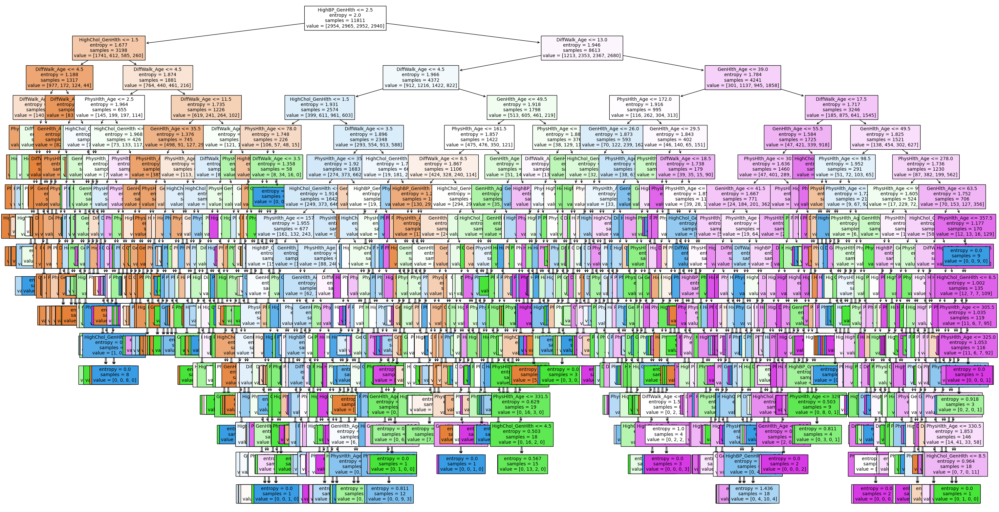

In [62]:
plt.figure(figsize=(37,20))  # set plot size (denoted in inches)
tree.plot_tree(clf, feature_names=X_train.columns,fontsize=10,filled = True)
plt.show()

(array([3937.,    0.,    0., 3937.,    0.,    0., 3937.,    0.,    0.,
        3937.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

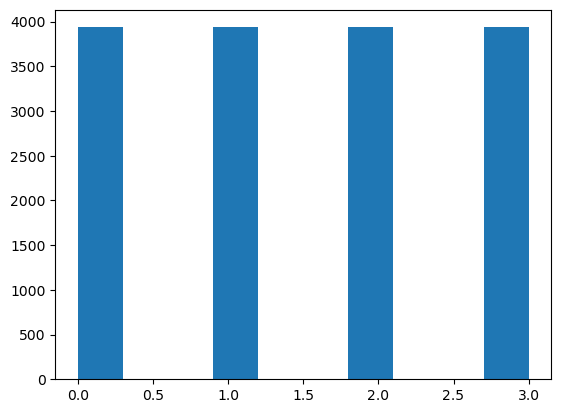

In [70]:

#Decision tree model with HD_Stroke against one variables
HD_1_df = HD_comb[HD_comb['HD_Stroke']==1] # dataset only include HD == 1
HD_0_df = HD_comb[HD_comb['HD_Stroke']==0] # dataset only include HD == 0
HD_2_df = HD_comb[HD_comb['HD_Stroke']==2] # dataset only include HD == 2
HD_3_df = HD_comb[HD_comb['HD_Stroke']==3] # dataset only include HD == 3



#for i in range(2):
#    HD_1_df = pd.concat([HD_1_df, HD_1_df.sample(n = len(HD_1_df), replace=True)])
    
#for i in range(1):
    #HD_0_df = HD_0_df.sample(n = len(HD_0_df), replace=True)
    
    #HD_2_df = pd.concat([HD_2_df, HD_2_df.sample(n = len(HD_2_df), replace=True)])
    

    
#for i in range(2):
 #   HD_3_df = pd.concat([HD_3_df, HD_3_df.sample(n = len(HD_3_df), replace=True)])
    
    
for i in range(10):
    HD_0_df =HD_0_df.sample(n = len(HD_3_df), replace=True)
    HD_1_df =HD_1_df.sample(n = len(HD_3_df), replace=True)
    HD_2_df =HD_2_df.sample(n = len(HD_3_df), replace=True)    
    HD_3_df =HD_3_df.sample(n = len(HD_3_df), replace=True)
    
#HD_0_df = pd.concat([HD_0_df, HD_0_df.sample(n = len(HD_1_df), replace=True)])

df_2 = pd.concat([HD_0_df, HD_1_df,HD_2_df,HD_3_df ])
train, test = train_test_split(df_2, test_size=0.25)
#zero_train, zero_test = train_test_split(HD_0_df, test_size=0.25)
#train = pd.concat((one_train,zero_train))
#test = pd.concat((one_test,zero_test))
X_train = train[["GenHlth","Age","HighBP","DiffWalk",'HighChol','PhysHlth' ]]
y_train = train[["HD_Stroke"]]
X_test = test[["GenHlth","Age","HighBP","DiffWalk",'HighChol','PhysHlth']]
y_test = test[["HD_Stroke"]]

plt.hist(df_2["HD_Stroke"])

In [76]:
#clf = tree.DecisionTreeClassifier()
clf = tree.DecisionTreeClassifier(max_depth = 16,criterion='entropy')
#clf = tree.DecisionTreeClassifier(criterion='entropy')
clf=clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.76      0.81      0.79       976
           1       0.73      0.67      0.70      1012
           2       0.68      0.69      0.69       968
           3       0.75      0.77      0.76       981

    accuracy                           0.73      3937
   macro avg       0.73      0.73      0.73      3937
weighted avg       0.73      0.73      0.73      3937



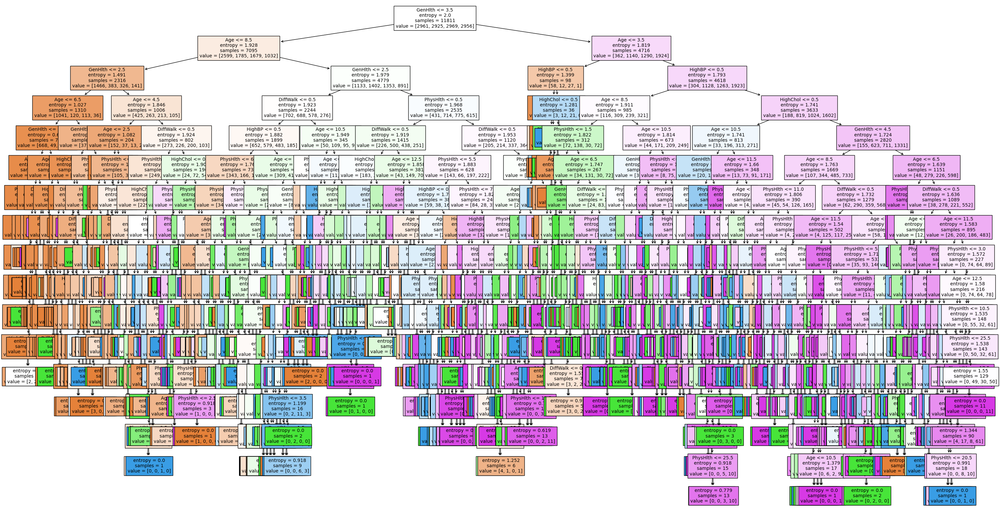

In [77]:
plt.figure(figsize=(37,20))  # set plot size (denoted in inches)
tree.plot_tree(clf, feature_names=X_train.columns,fontsize=10,filled = True)
plt.show()

In [161]:
#Alternative decision tree model
HD_1_df = df_copy[df_copy['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = df_copy[df_copy['HeartDiseaseorAttack']==0] # dataset only include HD == 0



#one_train, one_test = train_test_split(HD_1_df, test_size=0.25)
#zero_train, zero_test = train_test_split(HD_0_df, test_size=0.25)
#train = pd.concat((one_train,zero_train))
#test = pd.concat((one_test,zero_test))

train, test = train_test_split(HD_comb, test_size=0.25)

X_train = train[['BMI_Age','BMI_Income','BMI_PhysHlth','BMI_GenHlth']]
y_train = train[["HD_Stroke"]]
X_test = test[['BMI_Age','BMI_Income','BMI_PhysHlth','BMI_GenHlth']]
y_test = test[["HD_Stroke"]]

In [162]:
#clf = tree.DecisionTreeClassifier()
clf = tree.DecisionTreeClassifier(criterion='entropy')
clf=clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

In [163]:
#This give us the score for our decision tree model
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92     55808
           1       0.06      0.03      0.04      1577
           2       0.20      0.09      0.12      5073
           3       0.06      0.03      0.04       962

    accuracy                           0.85     63420
   macro avg       0.30      0.28      0.28     63420
weighted avg       0.80      0.85      0.82     63420



In [130]:
lst_col = heart_df.drop("HeartDiseaseorAttack", axis=1).columns

In [156]:
#This combined all the variable into separated columns and codified them
#["GenHlth_Age"] = two_way_Combin("GenHlth","Age")[0]
heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")

m_dict = {}
for i in range(0, len(lst_col)-1):
    for j in range(1, len(lst_col)):
        val = lst_col[i] + "_" + lst_col[j]
        new_col = two_way_Combin(lst_col[i],lst_col[j])[val]
        heart_df = pd.concat([heart_df, new_col], axis=1)
        
        m_dict[val] = cEntropy(heart_df['HeartDiseaseorAttack'],heart_df[val].astype(int))

In [163]:
#After creating the data set with all the interaction we decided exported to csv file
heart_df.to_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\HD_combination.csv")

In [103]:
heart_df["GenHlth_Age"]

0         64
1         36
2         64
3         15
4         15
          ..
253675    34
253676    41
253677     5
253678    36
253679    25
Name: GenHlth_Age, Length: 253680, dtype: int8

In [67]:
lst_col[2] + "_" + lst_col[3]

'CholCheck_BMI'

In [30]:
heart_df['HeartDiseaseorAttack'] = heart_df['HeartDiseaseorAttack'].astype('category')
heart_df['HeartDiseaseorAttack'].cat.codes

0         0
1         0
2         0
3         0
4         0
         ..
253675    0
253676    0
253677    0
253678    0
253679    1
Length: 253680, dtype: int8

In [56]:
n_df["GenHlth_Age"].value_counts()

2.0,9.0     11411
2.0,10.0    11167
2.0,8.0     10720
3.0,9.0      9791
3.0,10.0     9786
            ...  
4.0,1.0       363
5.0,4.0       286
5.0,3.0       168
5.0,2.0        83
5.0,1.0        51
Name: GenHlth_Age, Length: 65, dtype: int64

In [58]:
n_df["GenHlth_Age_new"].value_counts()

25    11411
14    11167
24    10720
38     9791
27     9786
      ...  
39      363
59      286
58      168
57       83
52       51
Name: GenHlth_Age_new, Length: 65, dtype: int64

In [48]:
type(n_df["GenHlth_Age_new"].astype(int))

pandas.core.series.Series

In [67]:
df_crosstab = pd.crosstab(HD_comb['HeartDiseaseorAttack'],HD_comb['GenHlth'],margins = True)
df_crosstab.T

HeartDiseaseorAttack,0.0,1.0,All
GenHlth,,,
1.0,44283,1016,45299
2.0,84956,4128,89084
3.0,67732,7914,75646
4.0,24842,6728,31570
5.0,7974,4107,12081
All,229787,23893,253680


In [29]:
df_crosstab = pd.crosstab(HD_comb['HeartDiseaseorAttack'],HD_comb['BMI'],margins = True)
df_crosstab.T

HeartDiseaseorAttack,0.0,1.0,All
BMI,,,
12.0,5,1,6
13.0,20,1,21
14.0,33,8,41
15.0,115,17,132
16.0,296,52,348
...,...,...,...
92.0,29,3,32
95.0,11,1,12
96.0,1,0,1


In [30]:
m_dict ={}
lst_col = heart_df.drop(["HeartDiseaseorAttack","Stroke"], axis=1).columns
for col in lst_col:
    m_dict[col] = cEntropy(com_df["HD_Stroke"], heart_df[col])
    
sorted_entropy = sorted(m_dict.items(), key=lambda x: x[1])
for col, entropy in sorted_entropy:
    print(col,"Entropy", entropy)

GenHlth Entropy 0.6174107435979237
Age Entropy 0.6269558812515634
HighBP Entropy 0.637299946017686
DiffWalk Entropy 0.6398510858234706
PhysHlth Entropy 0.6478880129913032
HighChol Entropy 0.649679834087291
Income Entropy 0.6543346940213799
Diabetes Entropy 0.6543711417199363
Smoker Entropy 0.6656815341404401
Education Entropy 0.666973049185613
PhysActivity Entropy 0.6694522681616484
Sex Entropy 0.6708608046291099
MentHlth Entropy 0.6709428672703579
BMI Entropy 0.6719681599498086
CholCheck Entropy 0.6741852529776382
Veggies Entropy 0.6745662640747261
NoDocbcCost Entropy 0.6752233317765843
HvyAlcoholConsump Entropy 0.6756064628968566
Fruits Entropy 0.6760505214822498
AnyHealthcare Entropy 0.6760677134353592


In [115]:
HD_0_df

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
120867,0.0,1.0,0.0,1.0,41.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,5.0,0.0,0.0,5.0,6.0,5.0
94025,0.0,1.0,1.0,1.0,29.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,2.0,0.0,0.0,0.0,7.0,6.0,8.0
28643,0.0,0.0,1.0,1.0,25.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,0.0,1.0,0.0,1.0,9.0,6.0,8.0
230872,0.0,1.0,1.0,1.0,34.0,0.0,0.0,2.0,0.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,0.0,10.0,5.0,7.0
91393,0.0,0.0,1.0,1.0,24.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,2.0,0.0,1.0,10.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93691,0.0,1.0,1.0,1.0,30.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,20.0,1.0,0.0,0.0,7.0,4.0,7.0
55745,0.0,0.0,1.0,1.0,29.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,3.0,4.0,0.0,0.0,11.0,6.0,5.0
1201,0.0,1.0,1.0,1.0,37.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,7.0,6.0,5.0
17906,0.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,10.0,6.0,8.0


In [58]:
heart_df["HeartDiseaseorAttack"].value_counts()

0.0    229787
1.0     23893
Name: HeartDiseaseorAttack, dtype: int64

In [72]:
for i in range(3):
    HD_1_df = pd.concat([HD_1_df, HD_1_df.sample(frac=1, replace=True)])
HD_1_df

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
8,1.0,1.0,1.0,1.0,30.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,5.0,30.0,30.0,1.0,0.0,9.0,5.0,1.0
20,1.0,1.0,1.0,1.0,22.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,30.0,0.0,1.0,0.0,12.0,4.0,4.0
26,1.0,1.0,1.0,1.0,37.0,1.0,1.0,2.0,0.0,0.0,...,1.0,0.0,5.0,0.0,0.0,1.0,1.0,10.0,6.0,5.0
27,1.0,1.0,1.0,1.0,28.0,1.0,0.0,2.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,12.0,2.0,4.0
47,1.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,2.0,1.0,0.0,0.0,1.0,10.0,4.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136992,1.0,1.0,1.0,1.0,36.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,5.0,0.0,0.0,0.0,1.0,8.0,4.0,7.0
121705,1.0,1.0,1.0,1.0,27.0,0.0,0.0,2.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,1.0,1.0,12.0,6.0,7.0
21569,1.0,0.0,0.0,1.0,27.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,12.0,4.0,5.0
124550,1.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,4.0,3.0,8.0,0.0,0.0,13.0,3.0,5.0


In [ ]:
#This gets us the mean of bostrap
def bootstrap_mean(df, varname):
    bootstrapped = df.sample(n=len(df), replace=True)
    return bootstrapped[varname].astype(int).mean()

In [46]:
#This function plots the histogram for boostrap
def plot_hist(x, p=5):
 # Plot the distribution and mark the mean
    plt.hist(x, alpha=.5)
    plt.axvline(x.mean())
 # 95% confidence interval 
    plt.axvline(np.percentile(x, p/2.), color='red', linewidth=3)
    plt.axvline(np.percentile(x, 100-p/2.), color='red', linewidth=3)

#this plot the distribution for bootsrap
def plot_dists(a, b, nbins, a_label='pop_A', b_label='pop_B', p=5):
 # Create a single sequence of bins to be shared across both
 # distribution plots for visualization consistency.
    combined = pd.concat([a, b])
    breaks = np.linspace(
    combined.min(), 
    combined.max(), 
    num=nbins+1) 
    plt.subplot(2, 1, 1)
    plot_hist(a)
    plt.title(a_label)
 
    plt.subplot(2, 1, 2)
    plot_hist(b)
    plt.title(b_label)
 
    plt.tight_layout()

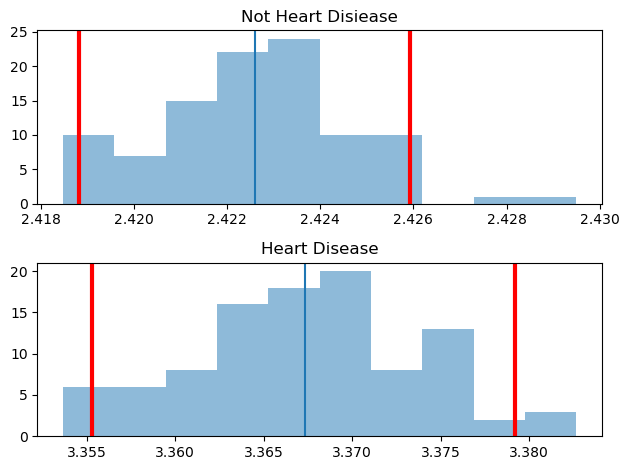

In [47]:
#With 100 iteration create the distribution of general health to proof boostrap is equivalent the real distribution
n = 100
HD_1_bootstrap_means = pd.Series([
 HD_1_df.sample(frac=1, replace=True).GenHlth.mean()
 for i in range(n)])

HD_0_bootstrap_means = pd.Series([
 HD_0_df.sample(frac=1, replace=True).GenHlth.mean()
 for i in range(n)])

plot_dists(HD_0_bootstrap_means, HD_1_bootstrap_means, 
 nbins=80, a_label='Not Heart Disiease', b_label='Heart Disease')

plt.show()

(array([229787.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 191144.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

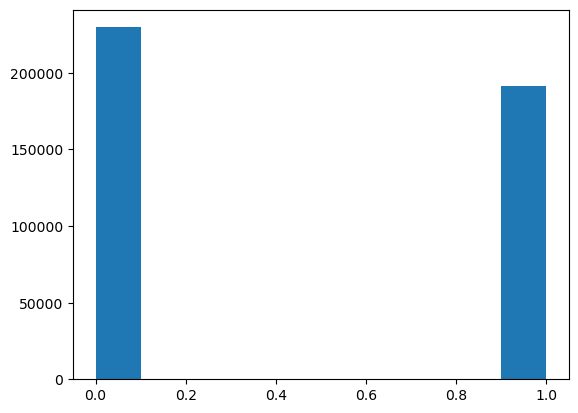

In [121]:
heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
HD_1_df = heart_df[heart_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = heart_df[heart_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0

for i in range(3):
    HD_1_df = pd.concat([HD_1_df, HD_1_df.sample(frac=1, replace=True)])
    
#HD_0_df = pd.concat([HD_0_df, HD_0_df.sample(frac=1, replace=True)])
new_HD_df = pd.concat([HD_0_df,HD_1_df])
#Plotting the count the 1 an 0 in heart diseases
plt.hist(new_HD_df["HeartDiseaseorAttack"])

In [116]:
#This separated the 1 and 0 for heart disease 
heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
HD_1_df = heart_df[heart_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = heart_df[heart_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0

In [118]:
HD_1_df

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
8,1.0,1.0,1.0,1.0,30.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,5.0,30.0,30.0,1.0,0.0,9.0,5.0,1.0
20,1.0,1.0,1.0,1.0,22.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,30.0,0.0,1.0,0.0,12.0,4.0,4.0
26,1.0,1.0,1.0,1.0,37.0,1.0,1.0,2.0,0.0,0.0,...,1.0,0.0,5.0,0.0,0.0,1.0,1.0,10.0,6.0,5.0
27,1.0,1.0,1.0,1.0,28.0,1.0,0.0,2.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,12.0,2.0,4.0
47,1.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,2.0,1.0,0.0,0.0,1.0,10.0,4.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253668,1.0,0.0,1.0,1.0,29.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,2.0,0.0,0.0,1.0,1.0,10.0,3.0,6.0
253670,1.0,1.0,1.0,1.0,25.0,0.0,0.0,2.0,0.0,1.0,...,1.0,0.0,5.0,15.0,0.0,1.0,0.0,13.0,6.0,4.0
253671,1.0,1.0,1.0,1.0,23.0,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,4.0,0.0,5.0,0.0,1.0,8.0,3.0,2.0
253672,1.0,1.0,0.0,1.0,30.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,2.0,1.0


In [117]:
HD_1_df.sample(frac=1, replace=True)

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
177155,1.0,1.0,1.0,1.0,31.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,6.0,5.0
214347,1.0,0.0,0.0,1.0,39.0,0.0,0.0,2.0,0.0,0.0,...,1.0,0.0,4.0,30.0,10.0,1.0,0.0,7.0,4.0,4.0
220869,1.0,0.0,1.0,1.0,30.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,20.0,1.0,0.0,8.0,5.0,1.0
119237,1.0,0.0,0.0,1.0,29.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,4.0,0.0,15.0,1.0,0.0,9.0,6.0,8.0
63308,1.0,1.0,1.0,1.0,30.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,5.0,5.0,30.0,1.0,0.0,11.0,2.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225770,1.0,1.0,1.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,12.0,6.0,8.0
112738,1.0,0.0,1.0,1.0,24.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,5.0,0.0,30.0,1.0,1.0,13.0,2.0,6.0
107360,1.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,2.0,0.0,0.0,0.0,7.0,5.0,8.0
84778,1.0,0.0,0.0,1.0,35.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,12.0,5.0,7.0


In [111]:
#restarting data set

#df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")

#Alternative result for entropy with a different resampling
lst_col = df_copy.drop(['HeartDiseaseorAttack',"Stroke"], axis =1).columns
df1 = df_copy
df1 = pd.concat([df1,com_df])
#for i in range(100):
 #   df1 = df1.sample(n =len(df1), replace=True)
    

dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df1['HD_Stroke'],df1[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

[('Age_BMI', 4.949337055942948),
 ('BMI_Age', 4.94933705594295),
 ('BMI_Income', 5.4033135125991745),
 ('BMI_PhysHlth', 5.5887231970080435),
 ('PhysHlth_BMI', 5.5887231970080435),
 ('BMI_GenHlth', 5.7060937201481305),
 ('GenHlth_BMI', 5.7060937201481305),
 ('BMI_MentHlth', 5.726080740807449),
 ('MentHlth_BMI', 5.7260807408074506),
 ('BMI_Education', 5.810982477176294),
 ('Education_BMI', 5.810982477176294),
 ('Age_Income', 5.914017953226132),
 ('PhysHlth_Age', 6.075810474370099),
 ('Age_PhysHlth', 6.075810474370099),
 ('GenHlth_Age', 6.173874351044315),
 ('Age_GenHlth', 6.173874351044315),
 ('Smoker_BMI', 6.216667817521202),
 ('BMI_Smoker', 6.216667817521206),
 ('MentHlth_Age', 6.222715722983617),
 ('Age_MentHlth', 6.222715722983619),
 ('HighChol_BMI', 6.227655545292468),
 ('BMI_HighChol', 6.227655545292468),
 ('BMI_Sex', 6.231365362105727),
 ('Sex_BMI', 6.231365362105727),
 ('HighBP_BMI', 6.241204857863892),
 ('BMI_Fruits', 6.241345676096458),
 ('Fruits_BMI', 6.241345676096458),
 ('Ag

In [83]:
df_copy['BMI'].astype(int)

0         4
1         3
2         3
3         3
4         2
         ..
253675    4
253676    1
253677    3
253678    2
253679    3
Name: BMI, Length: 253680, dtype: int32

In [81]:
df_copy['BMI']

0         4
1         3
2         3
3         3
4         2
         ..
253675    4
253676    1
253677    3
253678    2
253679    3
Name: BMI, Length: 253680, dtype: category
Categories (4, int64): [1 < 2 < 3 < 4]

### Conditional Entropy

In [21]:
#restart data set
#heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
HD_1_df = df_copy[df_copy['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = df_copy[df_copy['HeartDiseaseorAttack']==0] # dataset only include HD == 0


lst_col = heart_df.drop(['HeartDiseaseorAttack'], axis= 1).columns
#for i in range(100):
 #   HD_1_df = HD_1_df.sample(n = len(HD_1_df), replace=True)
  #  HD_0_df = HD_0_df.sample(n = len(HD_0_df), replace=True)

#this gets us the entropy for the heart disease against every variable  
df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df['HeartDiseaseorAttack'],df[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

[('GenHlth', 0.40391188201780226),
 ('Age', 0.40924029863383815),
 ('HighBP', 0.4183520169099111),
 ('DiffWalk', 0.42414012708185556),
 ('HighChol', 0.4267941415371749),
 ('PhysHlth', 0.4302893586691847),
 ('Diabetes', 0.43146151286595735),
 ('Stroke', 0.4315016311689524),
 ('Income', 0.4356420484508994),
 ('Smoker', 0.44088955265243013),
 ('Education', 0.443313064460678),
 ('Sex', 0.44498596682676717),
 ('PhysActivity', 0.44520530790212387),
 ('MentHlth', 0.4474466849538319),
 ('CholCheck', 0.4484162092066757),
 ('Veggies', 0.4492382687820262),
 ('HvyAlcoholConsump', 0.4496043657515937),
 ('NoDocbcCost', 0.4496468455296574),
 ('Fruits', 0.45000873012353726),
 ('AnyHealthcare', 0.45001419887106536),
 ('BMI', 0.4502885680686082)]

In [147]:
#restart data set
#heart_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\heart_disease_health_indicators_BRFSS2015.csv")
#df_copy = pd.concat([df_copy, com_df], axis = 1)

#HD_1_df = df_copy[df_copy['HD_Stroke']==1] # dataset only include HD == 1
#HD_0_df = df_copy[df_copy['HD_Stroke']==0] # dataset only include HD == 0
#HD_2_df = df_copy[df_copy['HD_Stroke']==2] # dataset only include HD == 2
#HD_3_df = df_copy[df_copy['HD_Stroke']==3] # dataset only include HD == 3
#HD_1_df = df_copy[df_copy['HeartDiseaseorAttack']==1] # dataset only include HD == 1
#HD_0_df = df_copy[df_copy['HeartDiseaseorAttack']==0] # dataset only include HD == 0

#this gets us the entropy for the heart disease against every variable  
lst_col = df_copy.drop(['HeartDiseaseorAttack','HD_Stroke','Stroke'], axis= 1).columns
#for i in range(100):
 #   HD_1_df = HD_1_df.sample(n = len(HD_1_df), replace=True)
  #  HD_0_df = HD_0_df.sample(n = len(HD_0_df), replace=True)

    
#df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df_copy['HD_Stroke'],df_copy[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

[('GenHlth', 0.6174107435979237),
 ('Age', 0.6269558812515634),
 ('HighBP', 0.637299946017686),
 ('DiffWalk', 0.6398510858234706),
 ('PhysHlth', 0.648938342618042),
 ('HighChol', 0.649679834087291),
 ('Income', 0.6543346940213799),
 ('Diabetes', 0.6543711417199363),
 ('Smoker', 0.6656815341404401),
 ('Education', 0.666973049185613),
 ('PhysActivity', 0.6694522681616484),
 ('Sex', 0.6708608046291099),
 ('MentHlth', 0.6716461689692417),
 ('CholCheck', 0.6741852529776382),
 ('Veggies', 0.6745662640747261),
 ('NoDocbcCost', 0.6752233317765843),
 ('HvyAlcoholConsump', 0.6756064628968566),
 ('Fruits', 0.6760505214822498),
 ('AnyHealthcare', 0.6760677134353592),
 ('BMI', 0.676404814342025)]

In [26]:
#THis is made to make entroyp more readable
lst_val = []
lst_names = []
for col in lst_col:
    val = dict_entropy[col]
    lst_val.append(val)
    lst_names.append(col)
    #print(H,lst[i])
    
entropy_df = pd.DataFrame([lst_val,lst_names]).T
entropy_df = entropy_df.sort_values(by =[0])
entropy_df.columns = ["entropy", "variable"]
#entropy_df["entropy"] = entropy_df["entropy"].div(10)
entropy_df

,entropy,variable
12,0.617411,GenHlth
17,0.626956,Age
0,0.6373,HighBP
15,0.639851,DiffWalk
14,0.648938,PhysHlth
1,0.64968,HighChol
19,0.654335,Income
5,0.654371,Diabetes
4,0.665682,Smoker
18,0.666973,Education


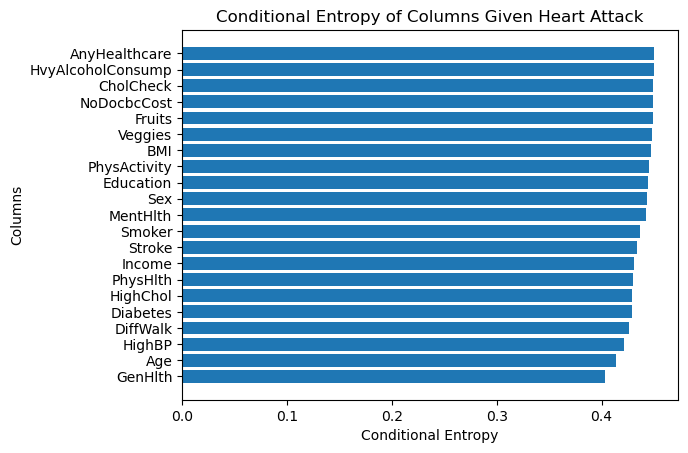

In [32]:
#Graphing the entropy
cols = [col for col, entropy in sorted_entropy]
entropies = [entropy for col, entropy in sorted_entropy]
plt.barh(range(len(entropies)), entropies)
plt.yticks(range(len(cols)), cols)
plt.xlabel('Conditional Entropy')
plt.ylabel('Columns')
plt.title('Conditional Entropy of Columns Given Heart Attack')
plt.show()

In [153]:
HD_comb_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\HD_combination.csv")
HD_1_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0

lst_col = HD_comb_df.drop(['HeartDiseaseorAttack','Unnamed: 0'], axis=1).columns

#for i in range(10):
  #  HD_1_df = pd.concat([HD_1_df,HD_1_df.sample(frac=1, replace=True)])
  #  HD_0_df = pd.concat([HD_0_df,HD_0_df.sample(frac=1, replace=True)])
 #   HD_1_df = HD_1_df.sample(n = len(HD_1_df), replace=True)
  #  HD_0_df = HD_0_df.sample(n = len(HD_0_df), replace=True)


df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df['HeartDiseaseorAttack'],df[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

[('Age_GenHlth', 0.370142872449863),
 ('GenHlth_Age', 0.3701428724498639),
 ('HighBP_GenHlth', 0.3878808547198904),
 ('Age_PhysHlth', 0.39000185589652325),
 ('PhysHlth_Age', 0.39000185589652414),
 ('HighChol_GenHlth', 0.39015358058330296),
 ('GenHlth_HighChol', 0.3901535805833034),
 ('DiffWalk_Age', 0.3911680743790198),
 ('Age_DiffWalk', 0.3911680743790207),
 ('HighBP_Age', 0.39324758567810303),
 ('Stroke_GenHlth', 0.3940374989134292),
 ('GenHlth_Stroke', 0.3940374989134292),
 ('Age_Stroke', 0.39516881795356973),
 ('Stroke_Age', 0.3951688179535706),
 ('HighChol_Age', 0.39632800853864136),
 ('Age_HighChol', 0.39632800853864136),
 ('Age_Diabetes', 0.397026213690749),
 ('Diabetes_Age', 0.39702621369075075),
 ('Diabetes_GenHlth', 0.3972819082862178),
 ('GenHlth_Diabetes', 0.39728190828621823),
 ('GenHlth_Sex', 0.39738898922522026),
 ('Sex_GenHlth', 0.39738898922522026),
 ('Age_Income', 0.3980299774763303),
 ('GenHlth_DiffWalk', 0.3991931284182493),
 ('DiffWalk_GenHlth', 0.3991931284182493)

In [ ]:
#THis is made to make entroyp more readable
lst_val = []
lst_names = []
for col in lst_col:
    val = dict_entropy[col]
    lst_val.append(val)
    lst_names.append(col)
    #print(H,lst[i])
    
entropy_df = pd.DataFrame([lst_val,lst_names]).T
entropy_df = entropy_df.sort_values(by =[0])
entropy_df.columns = ["entropy", "variable"]
entropy_df["entropy"] = entropy_df["entropy"]
entropy_df

In [24]:
#Choosing specific and making the entropy table
lst_names = ['GenHlth_Age', 'PhysHlth_Age', 'HighBP_GenHlth' ,'HighChol_GenHlth' , 'DiffWalk_Age' ,'HighBP_Age', 'GenHlth_Stroke' ]
lst_val = [0.3701428724498639 , 0.3878808547198904 , 0.39000185589652414 , 0.39015358058330296, 0.3911680743790198,0.39324758567810303 , 0.3940374989134292]

entropy_df = pd.DataFrame([lst_val,lst_names]).T
entropy_df = entropy_df.sort_values(by =[0])
entropy_df.columns = ["entropy", "variable"]
#entropy_df["entropy"] = entropy_df["entropy"].div(10)
entropy_df

,entropy,variable
0,0.370143,GenHlth_Age
1,0.387881,PhysHlth_Age
2,0.390002,HighBP_GenHlth
3,0.390154,HighChol_GenHlth
4,0.391168,DiffWalk_Age
5,0.393248,HighBP_Age
6,0.394037,GenHlth_Stroke


In [16]:

HD_1_df = HD_comb[HD_comb['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = HD_comb[HD_comb['HeartDiseaseorAttack']==0] # dataset only include HD == 0

lst_col = HD_comb.drop(['HD_Stroke', 'HeartDiseaseorAttack', 'Stroke'], axis=1).columns

#for i in range(1000):
  #  HD_1_df = pd.concat([HD_1_df,HD_1_df.sample(frac=1, replace=True)])
  #  HD_0_df = pd.concat([HD_0_df,HD_0_df.sample(frac=1, replace=True)])
 #   HD_1_df = HD_1_df.sample(frac=1, replace=True)
  #  HD_0_df = HD_0_df.sample(frac=1, replace=True)

#this gets us the entropy for the heart disease and stroke against every variable 
df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df['HD_Stroke'],df[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

[('GenHlth_Stroke', 0.39403749891342876),
 ('Stroke_GenHlth', 0.3940374989134292),
 ('Stroke_Age', 0.3951688179535706),
 ('Age_Stroke', 0.3951688179535706),
 ('HighBP_Stroke', 0.40459885379586824),
 ('HighChol_Stroke', 0.4108941282160625),
 ('Stroke_HighChol', 0.4108941282160625),
 ('Stroke_DiffWalk', 0.41188767147654914),
 ('DiffWalk_Stroke', 0.41188767147654926),
 ('PhysHlth_Stroke', 0.4158264358220145),
 ('Stroke_PhysHlth', 0.4158264358220154),
 ('Diabetes_Stroke', 0.41606507422276806),
 ('Stroke_Diabetes', 0.41606507422276817),
 ('Stroke_Income', 0.42072052200602617),
 ('Smoker_Stroke', 0.42345747809783907),
 ('Stroke_Smoker', 0.42345747809783907),
 ('Stroke_Sex', 0.4259640130697593),
 ('Sex_Stroke', 0.4259640130697593),
 ('Stroke_Education', 0.4261527756072456),
 ('Education_Stroke', 0.4261527756072456),
 ('Stroke_PhysActivity', 0.427670366184538),
 ('PhysActivity_Stroke', 0.427670366184538),
 ('BMI_Stroke', 0.42796021416794616),
 ('Stroke_BMI', 0.42796021416794616),
 ('Stroke_Men

In [18]:
#Choosing specific and making the entropy table
lst_names = ['GenHlth_Age', 'HighBP_GenHlth', 'PhysHlth_Age', 'DiffWalk_Age' ,'HighChol_GenHlth'  ,'HighBP_Age', 'Age_Income']
lst_val = [0.5757989249607967 ,  0.5975357111803548 ,0.598393431010317 , 0.6002974221461752, 0.6020050626122568,0.6071100184656801 , 0.608842889038975]

entropy_df = pd.DataFrame([lst_val,lst_names]).T
entropy_df = entropy_df.sort_values(by =[0])
entropy_df.columns = ["entropy", "variable"]
#entropy_df["entropy"] = entropy_df["entropy"].div(10)
entropy_df

,entropy,variable
0,0.575799,GenHlth_Age
1,0.597536,HighBP_GenHlth
2,0.598393,PhysHlth_Age
3,0.600297,DiffWalk_Age
4,0.602005,HighChol_GenHlth
5,0.60711,HighBP_Age
6,0.608843,Age_Income


In [ ]:
#Entropy with resampling 
HD_comb_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\HD_combination.csv")
HD_1_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0

lst_col = HD_comb_df.drop(['HeartDiseaseorAttack'], axis=1).columns

for i in range(1000):
  #  HD_1_df = pd.concat([HD_1_df,HD_1_df.sample(frac=1, replace=True)])
  #  HD_0_df = pd.concat([HD_0_df,HD_0_df.sample(frac=1, replace=True)])
    HD_1_df = HD_1_df.sample(frac=1, replace=True)
    HD_0_df = HD_0_df.sample(frac=1, replace=True)


df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df['HeartDiseaseorAttack'],df[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

In [38]:
#Entropy with resampling 
HD_comb_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\HD_combination.csv")
HD_1_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
HD_0_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0

lst_col = HD_comb_df.drop(['HeartDiseaseorAttack','Unnamed: 0'], axis=1).columns

for i in range(1000):
  #  HD_1_df = pd.concat([HD_1_df,HD_1_df.sample(frac=1, replace=True)])
  #  HD_0_df = pd.concat([HD_0_df,HD_0_df.sample(frac=1, replace=True)])
  #  HD_1_df = pd.concat([HD_1_df, HD_1_df.sample(frac=1, replace=True)])
    HD_0_df = HD_0_df.sample(frac=1, replace=True)
    HD_1_df = HD_1_df.sample(frac=1, replace=True)


df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(df['HeartDiseaseorAttack'],df[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

[('BMI_Age', 0.2032871950350419),
 ('Age_BMI', 0.20328719503504278),
 ('BMI_PhysHlth', 0.2095310288977803),
 ('PhysHlth_BMI', 0.20953102889778208),
 ('BMI_Income', 0.2199209106118012),
 ('BMI_GenHlth', 0.2329350311729046),
 ('GenHlth_BMI', 0.2329350311729046),
 ('BMI_MentHlth', 0.25921566381740924),
 ('MentHlth_BMI', 0.2592156638174101),
 ('Age_Income', 0.26199286447484216),
 ('Age_PhysHlth', 0.2758622993860058),
 ('PhysHlth_Age', 0.2758622993860067),
 ('MentHlth_Age', 0.2783247897014629),
 ('Age_MentHlth', 0.2783247897014638),
 ('Diabetes_BMI', 0.28426768613718156),
 ('BMI_Diabetes', 0.28426768613718334),
 ('HighBP_BMI', 0.2874783594371735),
 ('GenHlth_Age', 0.29297339961727875),
 ('Age_GenHlth', 0.2929733996172805),
 ('BMI_DiffWalk', 0.30239479141035996),
 ('DiffWalk_BMI', 0.30239479141036085),
 ('BMI_Education', 0.302800897425028),
 ('Education_BMI', 0.3028008974250289),
 ('PhysHlth_Income', 0.3030266195243927),
 ('BMI_HighChol', 0.3050074283337505),
 ('HighChol_BMI', 0.305007428333

(array([229787.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 191144.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

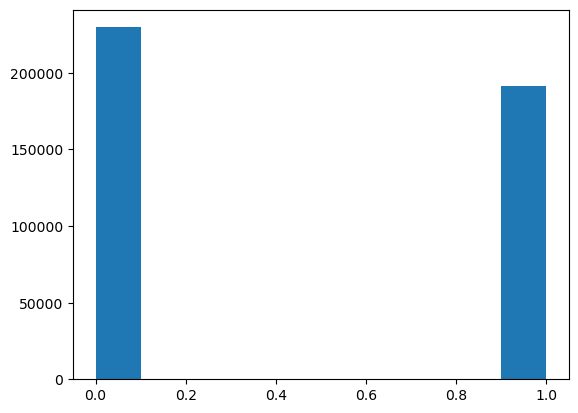

In [73]:
#Plotting the count the 1 an d0 in heart diseases
plt.hist(df['HeartDiseaseorAttack'])

In [107]:
#Entropy for heart disease and stroke against all other variables
HD_comb_df = pd.read_csv("C:\\Users\\Erick\\OneDrive\\Desktop\\STA 160\\HD_combination.csv")
#HD_1_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==1] # dataset only include HD == 1
#HD_0_df = HD_comb_df[HD_comb_df['HeartDiseaseorAttack']==0] # dataset only include HD == 0
HD_comb_df = pd.concat([HD_comb_df, com_df] , axis =1)

lst_col = HD_comb_df.drop(['HeartDiseaseorAttack','Unnamed: 0'], axis=1).columns

#for i in range(100):
  #  HD_1_df = pd.concat([HD_1_df,HD_1_df.sample(frac=1, replace=True)])
  #  HD_0_df = pd.concat([HD_0_df,HD_0_df.sample(frac=1, replace=True)])
   # HD_comb_df= HD_comb_df.sample(frac=1, replace=True)


#df= pd.concat([HD_0_df,HD_1_df])
dict_entropy ={}
for col in lst_col:
    dict_entropy[col]= cEntropy(HD_comb_df['HD_Stroke'],HD_comb_df[col])

sorted_entropy = sorted(dict_entropy.items(), key=lambda x: x[1])
sorted_entropy

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

(array([229787.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 191144.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

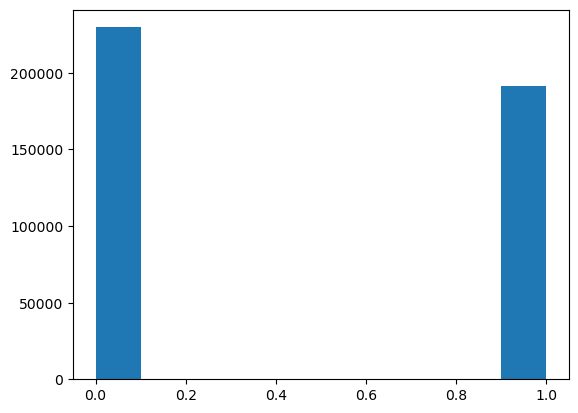

In [189]:
#Plotting the count the 1 an d0 in heart diseases
plt.hist(df['HeartDiseaseorAttack'])  